In [1]:
# HPC
import numpy as np
import xarray as xr
from scipy.interpolate import interp1d

# Plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
from matplotlib.ticker import LogLocator, NullFormatter
from matplotlib.colors import SymLogNorm
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import colors, ticker
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import cm as mplcm
from matplotlib.colors import TwoSlopeNorm
from matplotlib.gridspec import GridSpec

import cmocean
import cmocean.cm as cmo

# Paths and stuff
import os
import sys

import re
import warnings
warnings.filterwarnings("ignore")

sys.path.append('/home/shreyas/pySICOPOLIS/src')
from pySICOPOLIS import *

In [2]:
def plot_normal_new(
    x, y, data, *,
    cmap='RdBu_r', nbins=256,
    vmin=-10, vmax=10, center=0.0,
    cbar_ticks=None, cbar_label=None,
    fig=None, ax=None
):
    if ax is None:
        fig, ax = plt.subplots()

    # same norm for all panels
    norm = TwoSlopeNorm(vmin=vmin, vcenter=center, vmax=vmax)

    # same level boundaries for all panels
    levels = np.linspace(vmin, vmax, nbins)

    im = ax.contourf(x, y, data,
                     levels=levels, cmap=cmap, norm=norm,
                     extend='both')

    # colorbar with the SAME boundaries (fixes spacing)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    cb = fig.colorbar(im, cax=cax,
                      boundaries=levels, spacing='proportional',
                      extend='both')
    if cbar_ticks is not None:
        cb.set_ticks(cbar_ticks)
        cb.set_ticklabels([f'{t:g}' for t in cbar_ticks])
    if cbar_label:
        cb.set_label(cbar_label)

    return ax

def extract_costs_from_file(filepath, iter_final):
    cost_list = []
    misfit_cost_list = []
    reg_cost_list = []

    pattern = re.compile(
        r"Iteration\s+\d+:\s+Cost\s+=\s+([0-9.]+),\s+Misfit Cost\s+=\s+([0-9.]+),\s+Regularization Cost\s+=\s+([0-9.]+)"
    )

    with open(filepath, 'r') as file:
        for line in file:
            match = pattern.search(line)
            if match:
                cost, misfit, reg = map(float, match.groups())
                cost_list.append(cost)
                misfit_cost_list.append(misfit)
                reg_cost_list.append(reg)

    return cost_list[:iter_final + 1], misfit_cost_list[:iter_final + 1], reg_cost_list[:iter_final + 1]

def slice_at_depth_linear(age, depths, z: float, *, return_weights=False):
    """
    Linearly interpolate a 2D slice from a 3D array `age` at normalized depth `z`.

    Parameters
    ----------
    age : (nz, ny, nx) array_like
        3D field with depth along axis 0.
    depths : (nz,) array_like
        Monotonically increasing normalized depths corresponding to axis 0, e.g. [0.0 ... 1.0].
    z : float
        Target normalized depth to sample.
    return_weights : bool, optional
        If True, also return (i1, i2, w1, w2).

    Returns
    -------
    slice2d : (ny, nx) ndarray
        Interpolated 2D slice at depth z.
    (optional) i1, i2, w1, w2 :
        Indices of the bracketing layers and their linear weights such that:
        slice = w1*age[i1] + w2*age[i2], with w1+w2=1.
    """
    age = np.asarray(age)
    depths = np.asarray(depths)

    if age.ndim != 3:
        raise ValueError("`age` must be (nz, ny, nx)")
    if depths.ndim != 1 or depths.shape[0] != age.shape[0]:
        raise ValueError("`depths` must be (nz,) matching age.shape[0]")
    if not np.all(np.diff(depths) >= 0):
        raise ValueError("`depths` must be monotonic increasing")

    # Handle boundaries & exact hits
    if z <= depths[0]:
        sl = age[0].astype(np.result_type(age.dtype, np.float64), copy=False)
        return (sl, 0, 0, 1.0, 0.0) if return_weights else sl
    if z >= depths[-1]:
        sl = age[-1].astype(np.result_type(age.dtype, np.float64), copy=False)
        return (sl, len(depths)-1, len(depths)-1, 1.0, 0.0) if return_weights else sl

    # Find bracketing indices
    i2 = int(np.searchsorted(depths, z, side="left"))
    if depths[i2] == z:
        sl = age[i2].astype(np.result_type(age.dtype, np.float64), copy=False)
        return (sl, i2, i2, 1.0, 0.0) if return_weights else sl

    i1 = i2 - 1
    x1, x2 = depths[i1], depths[i2]

    # Linear weights
    w2 = (z - x1) / (x2 - x1)
    w1 = 1.0 - w2

    # Interpolate
    # Promote dtype to avoid integer truncation
    out_dtype = np.result_type(age.dtype, np.float64)
    slice2d = (w1 * age[i1].astype(out_dtype, copy=False) +
               w2 * age[i2].astype(out_dtype, copy=False))

    if return_weights:
        return slice2d, i1, i2, float(w1), float(w2)
    return slice2d

def frac_area(x, y, xx, yy):
    """
    Compute the fraction of the area of the small rectangle (xx, yy)
    within the large rectangle (x, y).

    Parameters:
        x, y:   Length-2 arrays for the large rectangle [x1, x2], [y1, y2]
        xx, yy: Length-2 arrays for the small rectangle

    Returns:
        Fraction of area of (xx, yy) within (x, y)
    """

    x = sorted(x)
    y = sorted(y)
    xx = sorted(xx)
    yy = sorted(yy)

    dx_inv = 1.0 / (x[1] - x[0])
    dy_inv = 1.0 / (y[1] - y[0])

    # Normalize coordinates of small rectangle to large rectangle frame
    xxm = (np.array(xx) - x[0]) * dx_inv
    yym = (np.array(yy) - y[0]) * dy_inv

    # Error check: small rectangle should not be larger than the big one
    if (xx[1] - xx[0] > x[1] - x[0]) or (yy[1] - yy[0] > y[1] - y[0]):
        raise ValueError("Small rectangle larger than large rectangle!")

    # Fully inside
    if 0 <= xxm[0] and xxm[1] <= 1 and 0 <= yym[0] and yym[1] <= 1:
        return 1.0

    # Edge overlap cases
    if 0 <= xxm[0] and xxm[1] <= 1:
        if yym[0] < 0 < yym[1]:
            return yym[1] / (yym[1] - yym[0])
        elif yym[0] < 1 < yym[1]:
            return (1 - yym[0]) / (yym[1] - yym[0])
        else:
            return 0.0

    if 0 <= yym[0] and yym[1] <= 1:
        if xxm[0] < 0 < xxm[1]:
            return xxm[1] / (xxm[1] - xxm[0])
        elif xxm[0] < 1 < xxm[1]:
            return (1 - xxm[0]) / (xxm[1] - xxm[0])
        else:
            return 0.0

    # Corner overlap cases
    denom = (xxm[1] - xxm[0]) * (yym[1] - yym[0])
    if denom == 0:
        return 0.0

    if xxm[0] < 0 < xxm[1] and yym[0] < 0 < yym[1]:
        return xxm[1] * yym[1] / denom
    if xxm[0] < 1 < xxm[1] and yym[0] < 0 < yym[1]:
        return (1 - xxm[0]) * yym[1] / denom
    if xxm[0] < 0 < xxm[1] and yym[0] < 1 < yym[1]:
        return xxm[1] * (1 - yym[0]) / denom
    if xxm[0] < 1 < xxm[1] and yym[0] < 1 < yym[1]:
        return (1 - xxm[0]) * (1 - yym[0]) / denom

    return 0.0

# -----------------------------
# Area-weighted downsampling (H)
def downsample_H(H_hr, x_hr, y_hr, x_lr, y_lr, dx_lr, dx_hr):
    """
    Downsample high-resolution H field from age data grid to a 
    coarser SICOPOLIS (sico) grid using area-weighted interpolation.

    Parameters:
        H_hr: H data from age data nc file (high resolution)
        x_hr, y_hr: 1D arrays of age data grid coordinates
        x_lr, y_lr: 1D arrays of coarse sico grid coordinates
        dx_lr: spacing of sico grid (same for x and y)
        dx_hr: horizontal resolution of age data grid (same for x and y)
    Returns:
        H_lr: downsampled H field
    """

    shape = (len(y_lr), len(x_lr))
    H_lr = np.zeros(shape)

    for j, y in enumerate(y_lr):
        for i, x in enumerate(x_lr):

            # Handle points outside age data domain as ocean
            if x < x_hr[0] or x > x_hr[-1] or y < y_hr[0] or y > y_hr[-1]:
                continue

            # Define bounding box around current coarse cell
            x1, x2 = x - 0.5*(dx_lr + dx_hr), x + 0.5*(dx_lr + dx_hr)
            y1, y2 = y - 0.5*(dx_lr + dx_hr), y + 0.5*(dx_lr + dx_hr)

            # Convert bounding box to index range in BedMachine grid
            ii1 = int(np.floor((x1 - x_hr[0]) / dx_hr))
            ii2 = int(np.ceil((x2 - x_hr[0]) / dx_hr))
            jj1 = int(np.floor((y1 - y_hr[0]) / dx_hr))
            jj2 = int(np.ceil((y2 - y_hr[0]) / dx_hr))

            H_sum = 0.0
            w_sum = 0.0

            # Loop over overlapping fine grid cells
            for jj in range(jj1, jj2):
                for ii in range(ii1, ii2):
                    if 0 <= ii < len(x_hr) and 0 <= jj < len(y_hr):
                        w = frac_area(
                            [x - 0.5*dx_lr, x + 0.5*dx_lr],
                            [y - 0.5*dx_lr, y + 0.5*dx_lr],
                            [x_hr[ii] - 0.5*dx_hr, x_hr[ii] + 0.5*dx_hr],
                            [y_hr[jj] - 0.5*dx_hr, y_hr[jj] + 0.5*dx_hr]
                        )
                        H_sum += w * H_hr[jj, ii]
                        w_sum += w

            # Normalize sums by total weight to get downsampled values
            if w_sum > 0:
                H_lr[j, i] = H_sum / w_sum

    return H_lr

In [118]:
modelPath = "/home/shreyas/update_to_develop_sicopolis/sicopolis_spinups/sico_out/"
dataPath = "/scratch2/shreyas/GrIS_paleo_data/"

initial_optim_idx = 52
initial_optim_initial_iteration = 0
initial_optim_final_iteration = 9

final_optim_idx = 56
final_optim_initial_iteration = 0
final_optim_final_iteration = 21

ds_bm5_40kms = xr.open_dataset("/scratch2/shreyas/GrIS_paleo_data/bm5_data_40kms.nc")
ds_bm5_40kms_orig = xr.open_dataset("/scratch2/shreyas/GrIS_paleo_data/bm5_data_40kms_orig.nc")
ds_age_40kms = xr.open_dataset(dataPath + "age_data_40kms.nc")

ds_ser_before_pI = xr.open_dataset(modelPath + "grl40_bm5_paleo17a_CT4_BH0_m11ka_pkp/grl40_bm5_paleo17a_CT4_BH0_m11ka_pkp_ser.nc")
ds_ser_before_pII = xr.open_dataset(f"/home/shreyas/update_to_develop_sicopolis/sicopolis_optim_AB_nodeltats_noconvinit_constrained_before_phase_II/sico_out/N_grl40_bm5_paleo17a_CT4_BH0_AC_BM5_m11ka_pkp/_ser.nc")
ds_ser_after_pII = xr.open_dataset(f"/home/shreyas/update_to_develop_sicopolis/sicopolis_optim_AB_nodeltats_noconvinit_constrained_after_phase_II/sico_out/N_grl40_bm5_paleo17a_CT4_BH0_AC_BM5_m11ka_pkp/_ser.nc")
    
ds_final_state_before_pI = xr.open_dataset(modelPath + "grl40_bm5_paleo17a_CT4_BH0_8point5CS_spinup_0ka/grl40_bm5_paleo17a_CT4_BH0_8point5CS_spinup_0ka0011.nc")
ds_final_state_before_pII = xr.open_dataset(f"/scratch2/shreyas/optim_AB_nodeltats_noconvinit_constrained_{initial_optim_idx}/inexact_gn_hessian_cg/final_sim_output_GNHessCG_iter_{initial_optim_initial_iteration}_fields.nc")
ds_final_state_after_pII = xr.open_dataset(f"/scratch2/shreyas/optim_AB_nodeltats_noconvinit_constrained_{final_optim_idx}/inexact_gn_hessian_cg/final_sim_output_GNHessCG_iter_{final_optim_final_iteration}_fields.nc")

ds_m4ka_state_before_pI = xr.open_dataset(modelPath + "grl40_bm5_paleo17a_CT4_BH0_8point5CS_spinup_0ka/grl40_bm5_paleo17a_CT4_BH0_8point5CS_spinup_0ka0008.nc")
ds_m4ka_state_before_pII = xr.open_dataset(f"/home/shreyas/update_to_develop_sicopolis/sicopolis_optim_AB_nodeltats_noconvinit_constrained_before_phase_II/sico_out/N_grl40_bm5_paleo17a_CT4_BH0_AC_BM5_m11ka_pkp/0003.nc")
ds_m4ka_state_after_pII = xr.open_dataset(f"/home/shreyas/update_to_develop_sicopolis/sicopolis_optim_AB_nodeltats_noconvinit_constrained_after_phase_II/sico_out/N_grl40_bm5_paleo17a_CT4_BH0_AC_BM5_m11ka_pkp/0003.nc")

ds_m1ka_state_before_pI = xr.open_dataset(modelPath + "grl40_bm5_paleo17a_CT4_BH0_8point5CS_spinup_0ka/grl40_bm5_paleo17a_CT4_BH0_8point5CS_spinup_0ka0009.nc")
ds_m1ka_state_before_pII = xr.open_dataset(f"/home/shreyas/update_to_develop_sicopolis/sicopolis_optim_AB_nodeltats_noconvinit_constrained_before_phase_II/sico_out/N_grl40_bm5_paleo17a_CT4_BH0_AC_BM5_m11ka_pkp/0004.nc")
ds_m1ka_state_after_pII = xr.open_dataset(f"/home/shreyas/update_to_develop_sicopolis/sicopolis_optim_AB_nodeltats_noconvinit_constrained_after_phase_II/sico_out/N_grl40_bm5_paleo17a_CT4_BH0_AC_BM5_m11ka_pkp/0004.nc")

# ds_mean_prior = xr.open_dataset("/scratch2/shreyas/thesis_results/chapter_7/mean_samples_prior.nc")
# ds_std_prior = xr.open_dataset("/scratch2/shreyas/thesis_results/chapter_7/std_samples_prior.nc")

ds_sample_prior_1 = xr.open_dataset("/scratch2/shreyas/thesis_results/chapter_7/prior_samples/prior_sample_1.nc")
ds_sample_prior_2 = xr.open_dataset("/scratch2/shreyas/thesis_results/chapter_7/prior_samples/prior_sample_2.nc")

ds_prior_X = xr.open_dataset("/scratch2/shreyas/optim_AB_nodeltats_noconvinit_constrained_52/prior_X.nc")

mask_BM5_2000 = (ds_bm5_40kms["H"].data >= 2000.0)*1.0
mask_BM5_2000[mask_BM5_2000 == 0] = -1.0

mask_land_before_pI = ds_final_state_before_pI["mask"].data.copy()
mask_land_before_pI[mask_land_before_pI == 0] = -1
mask_land_before_pI[mask_land_before_pI == 1] = -1
mask_land_before_pI[mask_land_before_pI == 2] = 1
mask_land_before_pI[mask_land_before_pI == 3] = 1

mask_ice_before_pI = ds_final_state_before_pI["mask"].data.copy()
mask_ice_before_pI[mask_ice_before_pI == 0] = -1
mask_ice_before_pI[mask_ice_before_pI == 3] = -1
mask_ice_before_pI[mask_ice_before_pI == 1] = 1
mask_ice_before_pI[mask_ice_before_pI == 2] = 1

mask_land_before_pII = ds_final_state_before_pII["mask"].data.copy()
mask_land_before_pII[mask_land_before_pII == 0] = -1
mask_land_before_pII[mask_land_before_pII == 1] = -1
mask_land_before_pII[mask_land_before_pII == 2] = 1
mask_land_before_pII[mask_land_before_pII == 3] = 1

mask_ice_before_pII = ds_final_state_before_pII["mask"].data.copy()
mask_ice_before_pII[mask_ice_before_pII == 0] = -1
mask_ice_before_pII[mask_ice_before_pII == 3] = -1
mask_ice_before_pII[mask_ice_before_pII == 1] = 1
mask_ice_before_pII[mask_ice_before_pII == 2] = 1

mask_land_after_pII = ds_final_state_before_pII["mask"].data.copy()
mask_land_after_pII[mask_land_after_pII == 0] = -1
mask_land_after_pII[mask_land_after_pII == 1] = -1
mask_land_after_pII[mask_land_after_pII == 2] = 1
mask_land_after_pII[mask_land_after_pII == 3] = 1

mask_ice_after_pII = ds_final_state_after_pII["mask"].data.copy()
mask_ice_after_pII[mask_ice_after_pII == 0] = -1
mask_ice_after_pII[mask_ice_after_pII == 3] = -1
mask_ice_after_pII[mask_ice_after_pII == 1] = 1
mask_ice_after_pII[mask_ice_after_pII == 2] = 1

costs_BM5_before_pI = 0.5*((ds_final_state_before_pI["H"].data - ds_bm5_40kms["H"].data)**2 / ds_bm5_40kms["H_uncert"].data**2)
costs_BM5_before_pII = 0.5*((ds_final_state_before_pII["H"].data - ds_bm5_40kms["H"].data)**2 / ds_bm5_40kms["H_uncert"].data**2)
costs_BM5_after_pII = 0.5*((ds_final_state_after_pII["H"].data - ds_bm5_40kms["H"].data)**2 / ds_bm5_40kms["H_uncert"].data**2)

cost_VC_before_pI = 0.5*((ds_final_state_before_pI["V_tot"].data - ds_bm5_40kms["V_dummy2d"].data[0, 0])**2 / ds_bm5_40kms["V_uncert_dummy2d"].data[0, 0]**2)
cost_VC_before_pII = 0.5*((ds_final_state_before_pII["V_tot"].data - ds_bm5_40kms["V_dummy2d"].data[0, 0])**2 / ds_bm5_40kms["V_uncert_dummy2d"].data[0, 0]**2)
cost_VC_after_pII = 0.5*((ds_final_state_after_pII["V_tot"].data - ds_bm5_40kms["V_dummy2d"].data[0, 0])**2 / ds_bm5_40kms["V_uncert_dummy2d"].data[0, 0]**2)

mask_AC = ((ds_age_40kms["age_c"].data >= 0) & (ds_age_40kms["age_c_uncert"].data > 0) & (ds_age_40kms["age_c"].data <= 134000) & (ds_bm5_40kms["H"].data[None, :, :] >= 2000.0))
costs_AC_before_pI = 0.5*(mask_AC * (ds_final_state_before_pI["age_c"].data - ds_age_40kms["age_c"].data)**2 / ds_age_40kms["age_c_uncert"].data**2)
costs_AC_before_pII = 0.5*(mask_AC * (ds_final_state_before_pII["age_c"].data - ds_age_40kms["age_c"].data)**2 / ds_age_40kms["age_c_uncert"].data**2)
costs_AC_after_pII = 0.5*(mask_AC * (ds_final_state_after_pII["age_c"].data - ds_age_40kms["age_c"].data)**2 / ds_age_40kms["age_c_uncert"].data**2)

ds_controls_state_0 = xr.open_dataset(f"/scratch2/shreyas/optim_AB_nodeltats_noconvinit_constrained_{initial_optim_idx}/inexact_gn_hessian_cg/state_GNHessCG_iter_{initial_optim_initial_iteration}.nc")
ds_controls_state = xr.open_dataset(f"/scratch2/shreyas/optim_AB_nodeltats_noconvinit_constrained_{final_optim_idx}/inexact_gn_hessian_cg/state_GNHessCG_iter_{final_optim_final_iteration}.nc")

costs, misfits, regs = extract_costs_from_file(f"/scratch2/shreyas/optim_AB_nodeltats_noconvinit_constrained_{initial_optim_idx}/inexact_gn_hessian_cg/inexact_gn_hessian_cg.log", initial_optim_final_iteration)
costs_p2, misfits_p2, regs_p2 = extract_costs_from_file(f"/scratch2/shreyas/optim_AB_nodeltats_noconvinit_constrained_{final_optim_idx}/inexact_gn_hessian_cg/inexact_gn_hessian_cg.log", final_optim_final_iteration)

costs_final = np.r_[costs, costs_p2]
misfits_final = np.r_[misfits, misfits_p2]
regs_final = np.r_[regs, regs_p2]

ds_vel  = xr.open_dataset(dataPath + 'RDGBV4_Greenland_1993_2013_01_balance_velocity_9ka.nc')
precip_radar_9ka_mean = downsample_H(ds_vel["accumulation_rate"].data[0].T, 
                                     ds_vel["x"].data[:, 0], 
                                     ds_vel["y"].data[0, :], 
                                     ds_age_40kms["x"].data, 
                                     ds_age_40kms["y"].data,
                                     40, 5)
precip = xr.open_dataset("/home/shreyas/update_to_develop_sicopolis/sicopolis/sico_in/grl/grl_rembo_40_precip.nc")
ds_precip_before_pI = xr.open_dataset("/home/shreyas/update_to_develop_sicopolis/sicopolis_optim_AB_nodeltats_noconvinit_constrained_before_phase_I/src/subroutines/tapenade/ad_io/ad_output_nodiff.nc")
ds_precip_before_pII = xr.open_dataset("/home/shreyas/update_to_develop_sicopolis/sicopolis_optim_AB_nodeltats_noconvinit_constrained_before_phase_II/src/subroutines/tapenade/ad_io/ad_output_nodiff.nc")
ds_precip_after_pII = xr.open_dataset("/home/shreyas/update_to_develop_sicopolis/sicopolis_optim_AB_nodeltats_noconvinit_constrained_after_phase_II/src/subroutines/tapenade/ad_io/ad_output_nodiff.nc")

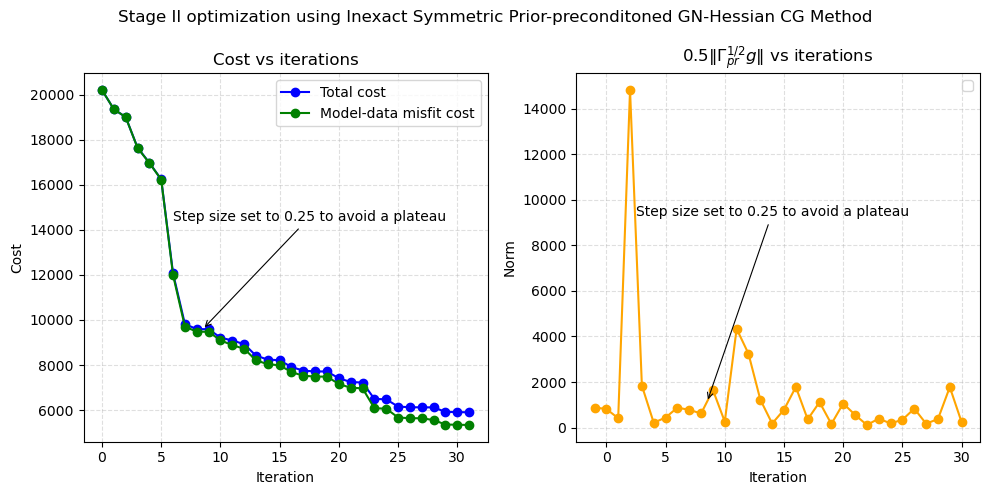

In [4]:
plt.rcParams["figure.figsize"] = (10, 5)
fig, ax = plt.subplots(1, 2)

ax[0].plot(np.arange(len(costs_final)), costs_final, linestyle='-', color='blue', marker = "o", label = "Total cost")
ax[0].plot(np.arange(len(costs_final)), misfits_final, linestyle='-', color='green', marker = "o", label = "Model-data misfit cost")
# ax[0].axhline(one_sigma_threshold, linestyle='-', color='red', label = r"1$\sigma$ error equivalent")
ax[0].set_xlabel('Iteration')
ax[0].set_ylabel('Cost')
ax[0].set_title('Cost vs iterations')
ax[0].grid(True, which='major', ls='--', alpha=0.4)
ax[0].legend()

ax[0].annotate(
    "Step size set to 0.25 to avoid a plateau",
    xy=(initial_optim_final_iteration - 0.5, costs_final[initial_optim_final_iteration]),              # point to annotate
    xytext=(initial_optim_final_iteration - 3.0, costs_final[initial_optim_final_iteration]*1.5),        # text position (to the right, slightly above)
    textcoords='data',
    arrowprops=dict(arrowstyle="->", color='black', lw=0.8),
    fontsize=10,
    ha='left'
)

# From /home/shreyas/pySICOPOLIS/examples/scripts/oAB_ndts_nci_c_56_8837.out AND /home/shreyas/pySICOPOLIS/examples/scripts/oAB_ndts_nci_c_52_8807.out
y = np.array([877.693479708729, 819.161804002797, 408.97049164124314, 14817.895773263515, 1840.8279431099577, 
              211.49932491756945, 440.6742612611617, 874.1724351417574, 779.326991639402, 618.3185928781801,
              1646.31040325956, 259.2092581340641, 4336.2496164231325, 3242.2943019032246, 1227.2232511367106,
              176.17729089613093, 784.5303480760623, 1782.5354009372147, 361.1876082149273, 1116.4671170182507,
              157.85807891156105, 1056.5107867224715, 559.9418042084073, 114.00735915482929, 392.6008167698978, 
              182.05374989619145, 344.1572766309832, 832.4890527682223, 172.37493965841824, 373.46389193569087,
              1776.2170159010686, 233.676011619913])

ax[1].plot(np.arange(len(costs_final)) - 1, y, linestyle='-', color='orange', marker = "o")
ax[1].set_xlabel('Iteration')
ax[1].set_ylabel('Norm')
ax[1].set_title('$0.5 \|\Gamma_{pr}^{1/2} g\|$ vs iterations')
ax[1].grid(True, which='major', ls='--', alpha=0.4)
ax[1].legend()

ax[1].annotate(
    "Step size set to 0.25 to avoid a plateau",
    xy=(initial_optim_final_iteration - 0.5, y[initial_optim_final_iteration] + 500.0),              # point to annotate
    xytext=(initial_optim_final_iteration - 6.5, y[initial_optim_final_iteration]*15.0),        # text position (to the right, slightly above)
    textcoords='data',
    arrowprops=dict(arrowstyle="->", color='black', lw=0.8),
    fontsize=10,
    ha='left'
)

plt.suptitle("Stage II optimization using Inexact Symmetric Prior-preconditoned GN-Hessian CG Method", fontsize=12)
plt.tight_layout()

plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/pII_optim_iterations.png")

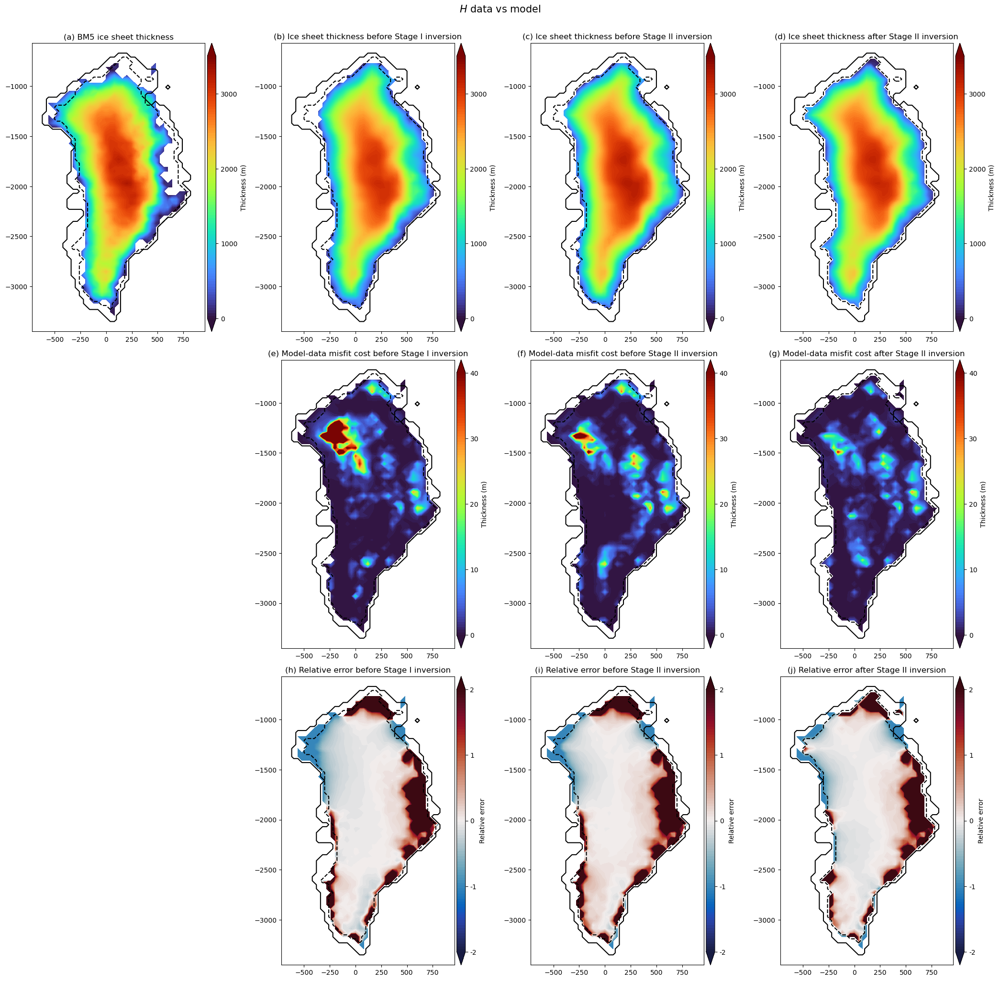

In [5]:
n_rows, n_cols = 3, 4
aspect_ratio = len(ds_bm5_40kms['x'])/len(ds_bm5_40kms['y'])
subplot_width = 4
subplot_height = subplot_width / aspect_ratio

plt.rcParams["figure.figsize"] = ((n_cols+1.25)*subplot_width, n_rows*subplot_height)
fig, ax = plt.subplots(n_rows, n_cols)

field = ds_bm5_40kms["H"].data.copy()
field[field == 0.0] = np.nan
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 3500.0, center = 1750.0,
                fig = fig, ax = ax[0, 0],
                cbar_label = r"Thickness (m)", cbar_ticks=[0.0, 1000.0, 2000.0, 3000.0])

ax[0, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 0].set_title("(a) BM5 ice sheet thickness")

field = ds_final_state_before_pI["H"].data.copy()
field[field == 0.0] = np.nan
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 3500.0, center = 1750.0,
                fig = fig, ax = ax[0, 1],
                cbar_label = r"Thickness (m)", cbar_ticks=[0.0, 1000.0, 2000.0, 3000.0])

ax[0, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 1].set_title("(b) Ice sheet thickness before Stage I inversion")

field = ds_final_state_before_pII["H"].data.copy()
field[field == 0.0] = np.nan
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 3500.0, center = 1750.0,
                fig = fig, ax = ax[0, 2],
                cbar_label = r"Thickness (m)", cbar_ticks=[0.0, 1000.0, 2000.0, 3000.0])

ax[0, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 2].set_title("(c) Ice sheet thickness before Stage II inversion")

field = ds_final_state_after_pII["H"].data.copy()
field[field == 0.0] = np.nan
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 3500.0, center = 1750.0,
                fig = fig, ax = ax[0, 3],
                cbar_label = r"Thickness (m)", cbar_ticks=[0.0, 1000.0, 2000.0, 3000.0])

ax[0, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 3].set_title("(d) Ice sheet thickness after Stage II inversion")

fig.delaxes(ax[1, 0])
ax[1, 0].set_visible(False)

field = costs_BM5_before_pI.copy()
field[field == 0.0] = np.nan
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 40.0, center = 20.0,
                fig = fig, ax = ax[1, 1],
                cbar_label = r"Thickness (m)", cbar_ticks=[0.0, 10.0, 20.0, 30.0, 40.0])

ax[1, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 1].set_title("(e) Model-data misfit cost before Stage I inversion")

field = costs_BM5_before_pII.copy()
field[field == 0.0] = np.nan
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 40.0, center = 20.0,
                fig = fig, ax = ax[1, 2],
                cbar_label = r"Thickness (m)", cbar_ticks=[0.0, 10.0, 20.0, 30.0, 40.0])

ax[1, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 2].set_title("(f) Model-data misfit cost before Stage II inversion")

field = costs_BM5_after_pII.copy()
field[field == 0.0] = np.nan
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 40.0, center = 20.0,
                fig = fig, ax = ax[1, 3],
                cbar_label = r"Thickness (m)", cbar_ticks=[0.0, 10.0, 20.0, 30.0, 40.0])

ax[1, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 3].set_title("(g) Model-data misfit cost after Stage II inversion")

fig.delaxes(ax[2, 0])
ax[2, 0].set_visible(False)

field = ds_final_state_before_pI["H"].data / ds_bm5_40kms["H"].data - 1
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                np.clip(field, -5, 5),
                cmap = 'cmo.balance', nbins = 100, vmin = -2, vmax = 2,
                fig = fig, ax = ax[2, 1],
                cbar_label = "Relative error", cbar_ticks=[-2, -1, 0, 1, 2])

ax[2, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2, 1].set_title("(h) Relative error before Stage I inversion")

field = ds_final_state_before_pII["H"].data / ds_bm5_40kms["H"].data - 1
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                np.clip(field, -5, 5),
                cmap = 'cmo.balance', nbins = 100, vmin = -2, vmax = 2,
                fig = fig, ax = ax[2, 2],
                cbar_label = "Relative error", cbar_ticks=[-2, -1, 0, 1, 2])

ax[2, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2, 2].set_title("(i) Relative error before Stage II inversion")

field = ds_final_state_after_pII["H"].data / ds_bm5_40kms["H"].data - 1
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                np.clip(field, -5, 5),
                cmap = 'cmo.balance', nbins = 100, vmin = -2, vmax = 2,
                fig = fig, ax = ax[2, 3],
                cbar_label = "Relative error", cbar_ticks=[-2, -1, 0, 1, 2])

ax[2, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2, 3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2, 3].set_title("(j) Relative error after Stage II inversion")

plt.suptitle("$H$ data vs model", fontsize=15, y=1.005)
plt.tight_layout()

plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/H_data_model.png")

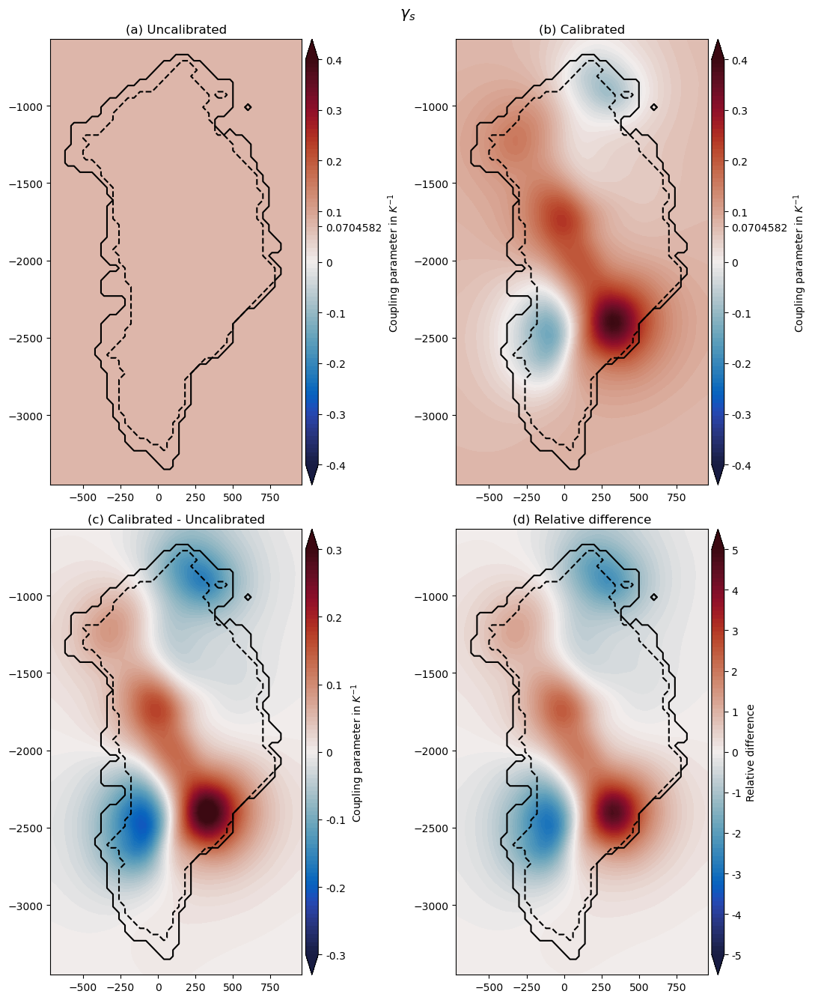

In [6]:
n_rows, n_cols = 2, 2
aspect_ratio = len(ds_age_40kms['x'])/len(ds_age_40kms['y'])
subplot_width = 4
subplot_height = subplot_width / aspect_ratio

plt.rcParams["figure.figsize"] = ((n_cols+0.75)*subplot_width, n_rows*subplot_height)
fig, ax = plt.subplots(n_rows, n_cols)

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                ds_controls_state_0["xx_gamma_s"].data,
                cmap = 'cmo.balance', nbins = 100, vmin = -0.4, vmax = 0.4, center = 0.0,
                fig = fig, ax = ax[0, 0],
                cbar_label = r"Coupling parameter in $K^{−1}$", cbar_ticks=[-0.4, -0.3, -0.2, -0.1, 0.0, 0.0704582, 0.1, 0.2, 0.3, 0.4])
ax[0, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 0].set_title("(a) Uncalibrated")

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                ds_controls_state["xx_gamma_s"].data,
                cmap = 'cmo.balance', nbins = 100, vmin = -0.4, vmax = 0.4, center = 0.0,
                fig = fig, ax = ax[0, 1],
                cbar_label = r"Coupling parameter in $K^{−1}$", cbar_ticks=[-0.4, -0.3, -0.2, -0.1, 0.0, 0.0704582, 0.1, 0.2, 0.3, 0.4])
ax[0, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 1].set_title("(b) Calibrated")

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                ds_controls_state["xx_gamma_s"].data - ds_controls_state_0["xx_gamma_s"].data,
                cmap = 'cmo.balance', nbins = 100, vmin = -0.3, vmax = 0.3, center = 0.0,
                fig = fig, ax = ax[1, 0],
                cbar_label = r"Coupling parameter in $K^{−1}$", cbar_ticks=[-0.3, -0.2, -0.1, 0.0, 0.1, 0.2, 0.3])
ax[1, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 0].set_title(r"(c) Calibrated - Uncalibrated")

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                ds_controls_state["xx_gamma_s"].data/ds_controls_state_0["xx_gamma_s"].data - 1,
                cmap = 'cmo.balance', nbins = 100, vmin = -5, vmax = 5, center = 0.0,
                fig = fig, ax = ax[1, 1],
                cbar_label = r"Relative difference", cbar_ticks=[-5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5])
ax[1, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 1].set_title(r"(d) Relative difference")

plt.suptitle("$\gamma_s$", fontsize=15)
plt.tight_layout()

plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/gamma_s_calibrated.png")

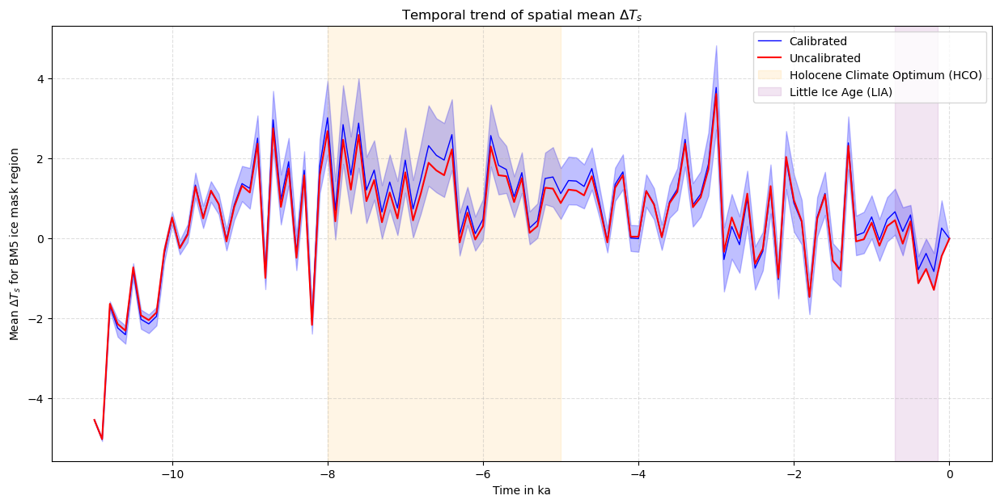

In [7]:
plt.rcParams["figure.figsize"] = (15, 7)
fig, ax = plt.subplots(1, 1)

mask_BM5 = (ds_bm5_40kms_orig["H"].data > 0)
mask_BM5[mask_BM5 == 0.0] = np.nan

delta_tda_temporal_0 = np.nanmean(ds_controls_state_0["xx_delta_tda"].data * mask_BM5[None, :, :], axis = (1, 2))
delta_tda_temporal = np.nanmean(ds_controls_state["xx_delta_tda"].data * mask_BM5[None, :, :], axis = (1, 2))
delta_tda_temporal_std = np.nanstd(ds_controls_state["xx_delta_tda"].data * mask_BM5[None, :, :], axis = (1, 2))

ax.plot(-11 + 0.1*np.arange(len(delta_tda_temporal_0)), delta_tda_temporal, linestyle='-', color='blue', label = "Calibrated", linewidth = 1.0)
ax.fill_between(-11 + 0.1*np.arange(len(delta_tda_temporal_0)), 
                y1= delta_tda_temporal + delta_tda_temporal_std, 
                y2= delta_tda_temporal - delta_tda_temporal_std, 
                color = "blue", alpha = 0.25)
ax.plot(-11 + 0.1*np.arange(len(delta_tda_temporal_0)), delta_tda_temporal_0, linestyle='-', color='red', label = "Uncalibrated", linewidth = 1.5)

ax.axvspan(xmin=-8, xmax=-5, color='orange', alpha=0.1, label="Holocene Climate Optimum (HCO)")
ax.axvspan(xmin=-0.7, xmax=-0.15, color='purple', alpha=0.1, label="Little Ice Age (LIA)")

ax.set_xlabel('Time in ka')
ax.set_ylabel('Mean $\Delta T_s$ for BM5 ice mask region')
ax.set_title("Temporal trend of spatial mean $\Delta T_s$")
ax.grid(True, which='major', ls='--', alpha=0.4)
ax.legend()

plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/delta_tda_temporal.png")

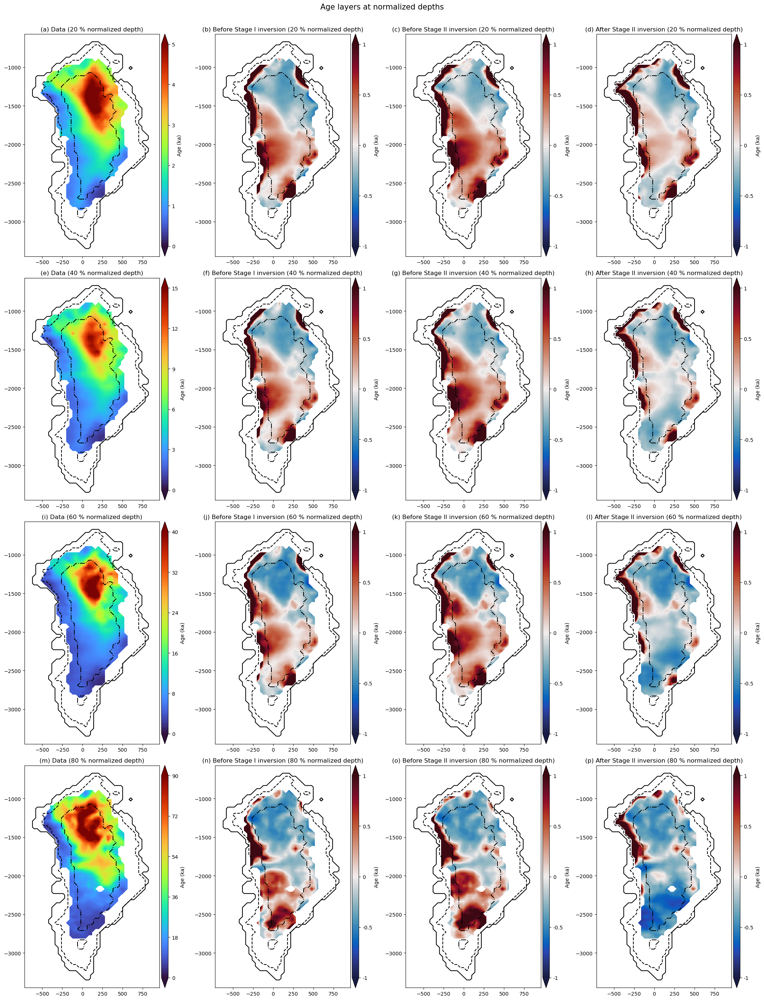

In [8]:
n_rows, n_cols = 4, 4
aspect_ratio = len(ds_age_40kms['x'])/len(ds_age_40kms['y'])
subplot_width = 4
subplot_height = subplot_width / aspect_ratio

plt.rcParams["figure.figsize"] = ((n_cols+1.25)*subplot_width, n_rows*subplot_height)
fig, ax = plt.subplots(n_rows, n_cols)

slice2d_data = slice_at_depth_linear(ds_age_40kms['age_c'].data, ds_age_40kms['sigma'].data, 0.8, return_weights=False)
slice2d_data[slice2d_data <= 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                slice2d_data / 1000.0,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 5.0, center = 2.5,
                fig = fig, ax = ax[0, 0],
                cbar_label = r"Age (ka)", cbar_ticks=[0.0, 1.0, 2.0, 3.0, 4.0, 5.0])

ax[0, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[0, 0].set_title(f"(a) Data (20 % normalized depth)")

slice2d = slice_at_depth_linear(ds_final_state_before_pI['age_c'].data, ds_age_40kms['sigma'].data, 0.8, return_weights=False)
slice2d[slice2d == 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                (slice2d / slice2d_data - 1),
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[0, 1],
                cbar_label = r"Age (ka)", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[0, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[0, 1].set_title(f"(b) Before Stage I inversion (20 % normalized depth)")

slice2d = slice_at_depth_linear(ds_final_state_before_pII['age_c'].data, ds_age_40kms['sigma'].data, 0.8, return_weights=False)
slice2d[slice2d == 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                (slice2d / slice2d_data - 1),
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[0, 2],
                cbar_label = r"Age (ka)", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[0, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[0, 2].set_title(f"(c) Before Stage II inversion (20 % normalized depth)")

slice2d = slice_at_depth_linear(ds_final_state_after_pII['age_c'].data, ds_age_40kms['sigma'].data, 0.8, return_weights=False)
slice2d[slice2d == 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                (slice2d / slice2d_data - 1),
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[0, 3],
                cbar_label = r"Age (ka)", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[0, 3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[0, 3].set_title(f"(d) After Stage II inversion (20 % normalized depth)")

slice2d_data = slice_at_depth_linear(ds_age_40kms['age_c'].data, ds_age_40kms['sigma'].data, 0.6, return_weights=False)
slice2d_data[slice2d_data <= 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                slice2d_data / 1000.0,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 15.0, center = 7.5,
                fig = fig, ax = ax[1, 0],
                cbar_label = r"Age (ka)", cbar_ticks=[0.0, 3.0, 6.0, 9.0, 12.0, 15.0])

ax[1, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[1, 0].set_title(f"(e) Data (40 % normalized depth)")

slice2d = slice_at_depth_linear(ds_final_state_before_pI['age_c'].data, ds_age_40kms['sigma'].data, 0.6, return_weights=False)
slice2d[slice2d == 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                (slice2d / slice2d_data - 1),
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[1, 1],
                cbar_label = r"Age (ka)", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[1, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[1, 1].set_title(f"(f) Before Stage I inversion (40 % normalized depth)")

slice2d = slice_at_depth_linear(ds_final_state_before_pII['age_c'].data, ds_age_40kms['sigma'].data, 0.6, return_weights=False)
slice2d[slice2d == 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                (slice2d / slice2d_data - 1),
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[1, 2],
                cbar_label = r"Age (ka)", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[1, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[1, 2].set_title(f"(g) Before Stage II inversion (40 % normalized depth)")

slice2d = slice_at_depth_linear(ds_final_state_after_pII['age_c'].data, ds_age_40kms['sigma'].data, 0.6, return_weights=False)
slice2d[slice2d == 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                (slice2d / slice2d_data - 1),
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[1, 3],
                cbar_label = r"Age (ka)", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[1, 3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[1, 3].set_title(f"(h) After Stage II inversion (40 % normalized depth)")

slice2d_data = slice_at_depth_linear(ds_age_40kms['age_c'].data, ds_age_40kms['sigma'].data, 0.4, return_weights=False)
slice2d_data[slice2d_data <= 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                slice2d_data / 1000.0,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 40.0, center = 20.0,
                fig = fig, ax = ax[2, 0],
                cbar_label = r"Age (ka)", cbar_ticks=[0.0, 8.0, 16.0, 24.0, 32.0, 40.0])

ax[2, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[2, 0].set_title(f"(i) Data (60 % normalized depth)")

slice2d = slice_at_depth_linear(ds_final_state_before_pI['age_c'].data, ds_age_40kms['sigma'].data, 0.4, return_weights=False)
slice2d[slice2d == 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                (slice2d / slice2d_data - 1),
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[2, 1],
                cbar_label = r"Age (ka)", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[2, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[2, 1].set_title(f"(j) Before Stage I inversion (60 % normalized depth)")

slice2d = slice_at_depth_linear(ds_final_state_before_pII['age_c'].data, ds_age_40kms['sigma'].data, 0.4, return_weights=False)
slice2d[slice2d == 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                (slice2d / slice2d_data - 1),
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[2, 2],
                cbar_label = r"Age (ka)", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[2, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[2, 2].set_title(f"(k) Before Stage II inversion (60 % normalized depth)")

slice2d = slice_at_depth_linear(ds_final_state_after_pII['age_c'].data, ds_age_40kms['sigma'].data, 0.4, return_weights=False)
slice2d[slice2d == 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                (slice2d / slice2d_data - 1),
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[2, 3],
                cbar_label = r"Age (ka)", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[2, 3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[2, 3].set_title(f"(l) After Stage II inversion (60 % normalized depth)")

slice2d_data = slice_at_depth_linear(ds_age_40kms['age_c'].data, ds_age_40kms['sigma'].data, 0.2, return_weights=False)
slice2d_data[slice2d_data <= 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                slice2d_data / 1000.0,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 90.0, center = 45.0,
                fig = fig, ax = ax[3, 0],
                cbar_label = r"Age (ka)", cbar_ticks=[0.0, 18.0, 36.0, 54.0, 72.0, 90.0])

ax[3, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[3, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[3, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[3, 0].set_title(f"(m) Data (80 % normalized depth)")

slice2d = slice_at_depth_linear(ds_final_state_before_pI['age_c'].data, ds_age_40kms['sigma'].data, 0.2, return_weights=False)
slice2d[slice2d == 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                (slice2d / slice2d_data - 1),
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[3, 1],
                cbar_label = r"Age (ka)", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[3, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[3, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[3, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[3, 1].set_title(f"(n) Before Stage I inversion (80 % normalized depth)")

slice2d = slice_at_depth_linear(ds_final_state_before_pII['age_c'].data, ds_age_40kms['sigma'].data, 0.2, return_weights=False)
slice2d[slice2d == 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                (slice2d / slice2d_data - 1),
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[3, 2],
                cbar_label = r"Age (ka)", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[3, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[3, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[3, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[3, 2].set_title(f"(o) Before Stage II inversion (80 % normalized depth)")

slice2d = slice_at_depth_linear(ds_final_state_after_pII['age_c'].data, ds_age_40kms['sigma'].data, 0.2, return_weights=False)
slice2d[slice2d == 0.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                (slice2d / slice2d_data - 1),
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[3, 3],
                cbar_label = r"Age (ka)", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[3, 3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[3, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[3, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[3, 3].set_title(f"(p) After Stage II inversion (80 % normalized depth)")

plt.suptitle("Age layers at normalized depths", fontsize=15, y=1.005)
plt.tight_layout()

plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/age_data_model_normalized_depths.png")

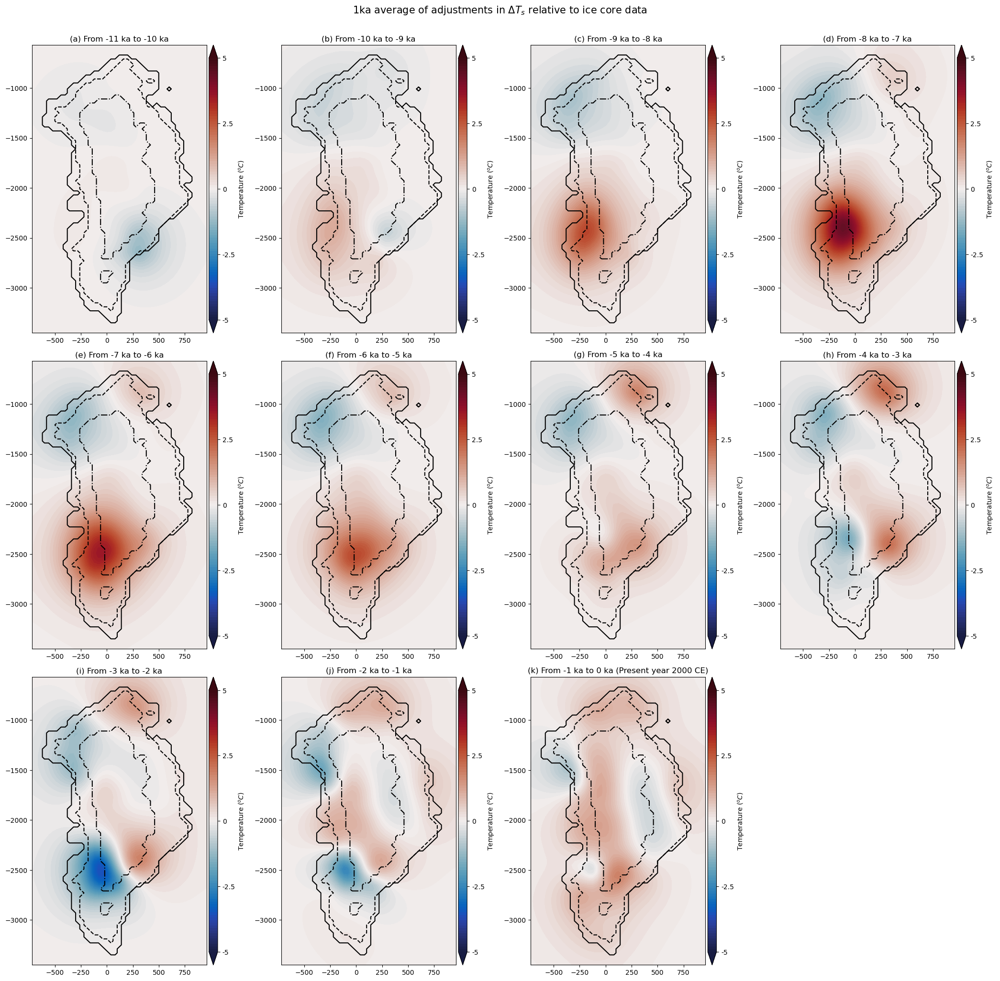

In [9]:
n_rows, n_cols = 3, 4
aspect_ratio = len(ds_bm5_40kms['x'])/len(ds_bm5_40kms['y'])
subplot_width = 4
subplot_height = subplot_width / aspect_ratio

plt.rcParams["figure.figsize"] = ((n_cols+1.25)*subplot_width, n_rows*subplot_height)
fig, ax = plt.subplots(n_rows, n_cols)

xx_delta_tda = ds_controls_state["xx_delta_tda"].data.copy()
xx_delta_tda_0 = ds_controls_state_0["xx_delta_tda"].data.copy()

idx = 0
field = (xx_delta_tda[idx] + xx_delta_tda[idx + 10])*0.5 + np.sum(xx_delta_tda[idx + 1: idx + 10], axis = (0,))
field = field - ((xx_delta_tda_0[idx] + xx_delta_tda_0[idx + 10])*0.5 + np.sum(xx_delta_tda_0[idx + 1: idx + 10], axis = (0,)))
field = field / 10.0
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = cmo.balance, nbins = 100, vmin = -5.0, vmax = 5.0, center = 0.0,
                fig = fig, ax = ax[0, 0],
                cbar_label = r"Temperature ($^{o}C$)", cbar_ticks=[-5.0, -2.5, 0.0, 2.5, 5.0])

ax[0, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")
ax[0, 0].set_title("(a) From -11 ka to -10 ka")

idx = 10
field = (xx_delta_tda[idx] + xx_delta_tda[idx + 10])*0.5 + np.sum(xx_delta_tda[idx + 1: idx + 10], axis = (0,))
field = field - ((xx_delta_tda_0[idx] + xx_delta_tda_0[idx + 10])*0.5 + np.sum(xx_delta_tda_0[idx + 1: idx + 10], axis = (0,)))
field = field / 10.0
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = cmo.balance, nbins = 100, vmin = -5.0, vmax = 5.0, center = 0.0,
                fig = fig, ax = ax[0, 1],
                cbar_label = r"Temperature ($^{o}C$)", cbar_ticks=[-5.0, -2.5, 0.0, 2.5, 5.0])

ax[0, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")
ax[0, 1].set_title("(b) From -10 ka to -9 ka")

idx = 20
field = (xx_delta_tda[idx] + xx_delta_tda[idx + 10])*0.5 + np.sum(xx_delta_tda[idx + 1: idx + 10], axis = (0,))
field = field - ((xx_delta_tda_0[idx] + xx_delta_tda_0[idx + 10])*0.5 + np.sum(xx_delta_tda_0[idx + 1: idx + 10], axis = (0,)))
field = field / 10.0
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = cmo.balance, nbins = 100, vmin = -5.0, vmax = 5.0, center = 0.0,
                fig = fig, ax = ax[0, 2],
                cbar_label = r"Temperature ($^{o}C$)", cbar_ticks=[-5.0, -2.5, 0.0, 2.5, 5.0])

ax[0, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")
ax[0, 2].set_title("(c) From -9 ka to -8 ka")

idx = 30
field = (xx_delta_tda[idx] + xx_delta_tda[idx + 10])*0.5 + np.sum(xx_delta_tda[idx + 1: idx + 10], axis = (0,))
field = field - ((xx_delta_tda_0[idx] + xx_delta_tda_0[idx + 10])*0.5 + np.sum(xx_delta_tda_0[idx + 1: idx + 10], axis = (0,)))
field = field / 10.0
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = cmo.balance, nbins = 100, vmin = -5.0, vmax = 5.0, center = 0.0,
                fig = fig, ax = ax[0, 3],
                cbar_label = r"Temperature ($^{o}C$)", cbar_ticks=[-5.0, -2.5, 0.0, 2.5, 5.0])

ax[0, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")
ax[0, 3].set_title("(d) From -8 ka to -7 ka")

idx = 40
field = (xx_delta_tda[idx] + xx_delta_tda[idx + 10])*0.5 + np.sum(xx_delta_tda[idx + 1: idx + 10], axis = (0,))
field = field - ((xx_delta_tda_0[idx] + xx_delta_tda_0[idx + 10])*0.5 + np.sum(xx_delta_tda_0[idx + 1: idx + 10], axis = (0,)))
field = field / 10.0
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = cmo.balance, nbins = 100, vmin = -5.0, vmax = 5.0, center = 0.0,
                fig = fig, ax = ax[1, 0],
                cbar_label = r"Temperature ($^{o}C$)", cbar_ticks=[-5.0, -2.5, 0.0, 2.5, 5.0])

ax[1, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")
ax[1, 0].set_title("(e) From -7 ka to -6 ka")

idx = 50
field = (xx_delta_tda[idx] + xx_delta_tda[idx + 10])*0.5 + np.sum(xx_delta_tda[idx + 1: idx + 10], axis = (0,))
field = field - ((xx_delta_tda_0[idx] + xx_delta_tda_0[idx + 10])*0.5 + np.sum(xx_delta_tda_0[idx + 1: idx + 10], axis = (0,)))
field = field / 10.0
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = cmo.balance, nbins = 100, vmin = -5.0, vmax = 5.0, center = 0.0,
                fig = fig, ax = ax[1, 1],
                cbar_label = r"Temperature ($^{o}C$)", cbar_ticks=[-5.0, -2.5, 0.0, 2.5, 5.0])

ax[1, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")
ax[1, 1].set_title("(f) From -6 ka to -5 ka")

idx = 60
field = (xx_delta_tda[idx] + xx_delta_tda[idx + 10])*0.5 + np.sum(xx_delta_tda[idx + 1: idx + 10], axis = (0,))
field = field - ((xx_delta_tda_0[idx] + xx_delta_tda_0[idx + 10])*0.5 + np.sum(xx_delta_tda_0[idx + 1: idx + 10], axis = (0,)))
field = field / 10.0
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = cmo.balance, nbins = 100, vmin = -5.0, vmax = 5.0, center = 0.0,
                fig = fig, ax = ax[1, 2],
                cbar_label = r"Temperature ($^{o}C$)", cbar_ticks=[-5.0, -2.5, 0.0, 2.5, 5.0])

ax[1, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")
ax[1, 2].set_title("(g) From -5 ka to -4 ka")

idx = 70
field = (xx_delta_tda[idx] + xx_delta_tda[idx + 10])*0.5 + np.sum(xx_delta_tda[idx + 1: idx + 10], axis = (0,))
field = field - ((xx_delta_tda_0[idx] + xx_delta_tda_0[idx + 10])*0.5 + np.sum(xx_delta_tda_0[idx + 1: idx + 10], axis = (0,)))
field = field / 10.0
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = cmo.balance, nbins = 100, vmin = -5.0, vmax = 5.0, center = 0.0,
                fig = fig, ax = ax[1, 3],
                cbar_label = r"Temperature ($^{o}C$)", cbar_ticks=[-5.0, -2.5, 0.0, 2.5, 5.0])

ax[1, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")
ax[1, 3].set_title("(h) From -4 ka to -3 ka")

idx = 80
field = (xx_delta_tda[idx] + xx_delta_tda[idx + 10])*0.5 + np.sum(xx_delta_tda[idx + 1: idx + 10], axis = (0,))
field = field - ((xx_delta_tda_0[idx] + xx_delta_tda_0[idx + 10])*0.5 + np.sum(xx_delta_tda_0[idx + 1: idx + 10], axis = (0,)))
field = field / 10.0
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = cmo.balance, nbins = 100, vmin = -5.0, vmax = 5.0, center = 0.0,
                fig = fig, ax = ax[2, 0],
                cbar_label = r"Temperature ($^{o}C$)", cbar_ticks=[-5.0, -2.5, 0.0, 2.5, 5.0])

ax[2, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")
ax[2, 0].set_title("(i) From -3 ka to -2 ka")

idx = 90
field = (xx_delta_tda[idx] + xx_delta_tda[idx + 10])*0.5 + np.sum(xx_delta_tda[idx + 1: idx + 10], axis = (0,))
field = field - ((xx_delta_tda_0[idx] + xx_delta_tda_0[idx + 10])*0.5 + np.sum(xx_delta_tda_0[idx + 1: idx + 10], axis = (0,)))
field = field / 10.0
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = cmo.balance, nbins = 100, vmin = -5.0, vmax = 5.0, center = 0.0,
                fig = fig, ax = ax[2, 1],
                cbar_label = r"Temperature ($^{o}C$)", cbar_ticks=[-5.0, -2.5, 0.0, 2.5, 5.0])

ax[2, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")
ax[2, 1].set_title("(j) From -2 ka to -1 ka")

idx = 100
field = (xx_delta_tda[idx] + xx_delta_tda[idx + 10])*0.5 + np.sum(xx_delta_tda[idx + 1: idx + 10], axis = (0,))
field = field - ((xx_delta_tda_0[idx] + xx_delta_tda_0[idx + 10])*0.5 + np.sum(xx_delta_tda_0[idx + 1: idx + 10], axis = (0,)))
field = field / 10.0
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = cmo.balance, nbins = 100, vmin = -5.0, vmax = 5.0, center = 0.0,
                fig = fig, ax = ax[2, 2],
                cbar_label = r"Temperature ($^{o}C$)", cbar_ticks=[-5.0, -2.5, 0.0, 2.5, 5.0])

ax[2, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")
ax[2, 2].set_title("(k) From -1 ka to 0 ka (Present year 2000 CE)")

fig.delaxes(ax[2, 3])
ax[2, 3].set_visible(False)

plt.suptitle("1ka average of adjustments in $\Delta T_s$ relative to ice core data", fontsize=15, y=1.005)
plt.tight_layout()

plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/delta_tda_1ka_means.png")

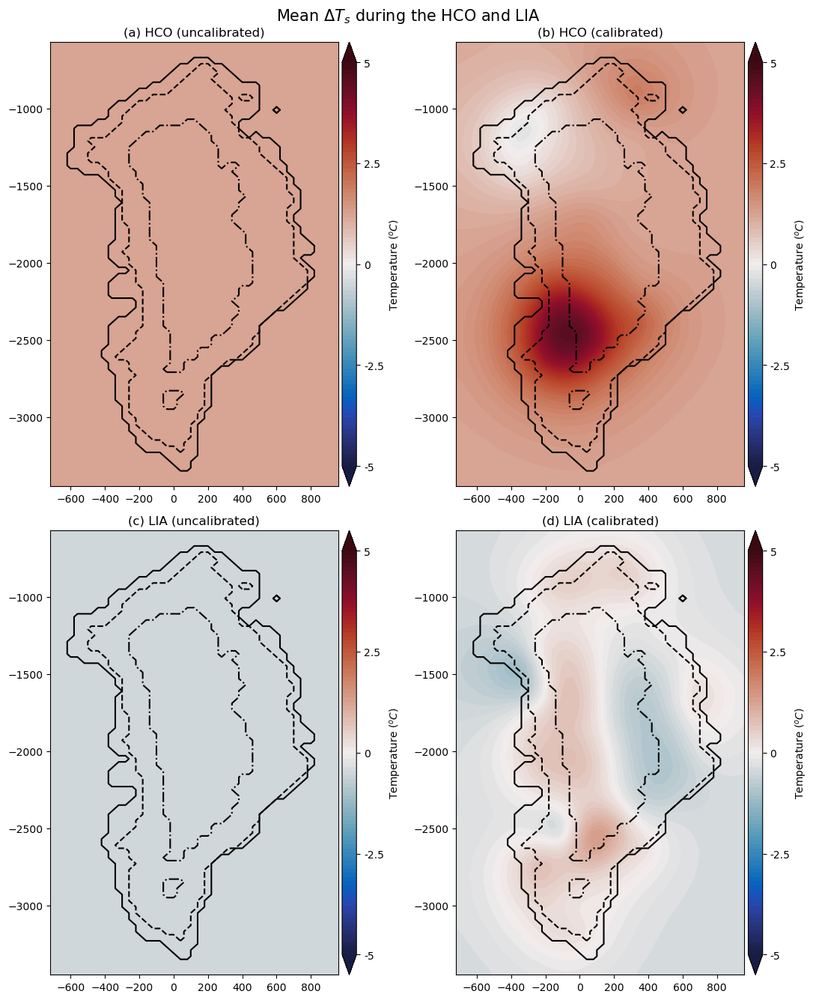

In [10]:
n_rows, n_cols = 2, 2
aspect_ratio = len(ds_bm5_40kms['x'])/len(ds_bm5_40kms['y'])
subplot_width = 4
subplot_height = subplot_width / aspect_ratio

plt.rcParams["figure.figsize"] = ((n_cols+0.75)*subplot_width, n_rows*subplot_height)
fig, ax = plt.subplots(n_rows, n_cols)

xx_delta_tda = ds_controls_state["xx_delta_tda"].data.copy()
xx_delta_tda_0 = ds_controls_state_0["xx_delta_tda"].data.copy()

field = (xx_delta_tda_0[30] + xx_delta_tda_0[60])*0.5 + np.sum(xx_delta_tda_0[31: 60], axis = (0,))
field = field / 30.0
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = cmo.balance, nbins = 100, vmin = -5.0, vmax = 5.0, center = 0.0,
                fig = fig, ax = ax[0, 0],
                cbar_label = r"Temperature ($^{o}C$)", cbar_ticks=[-5.0, -2.5, 0.0, 2.5, 5.0])

ax[0, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")
ax[0, 0].set_title("(a) HCO (uncalibrated)")

field = (xx_delta_tda[30] + xx_delta_tda[60])*0.5 + np.sum(xx_delta_tda[31: 60], axis = (0,))
field = field / 30.0
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = cmo.balance, nbins = 100, vmin = -5.0, vmax = 5.0, center = 0.0,
                fig = fig, ax = ax[0, 1],
                cbar_label = r"Temperature ($^{o}C$)", cbar_ticks=[-5.0, -2.5, 0.0, 2.5, 5.0])

ax[0, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")
ax[0, 1].set_title("(b) HCO (calibrated)")

field = xx_delta_tda_0[103]*0.5 + np.sum(xx_delta_tda_0[104:108], axis = (0,)) + 7/8 * xx_delta_tda_0[108] + 1/8 * xx_delta_tda_0[109]
field = field / 5.5
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = cmo.balance, nbins = 100, vmin = -5.0, vmax = 5.0, center = 0.0,
                fig = fig, ax = ax[1, 0],
                cbar_label = r"Temperature ($^{o}C$)", cbar_ticks=[-5.0, -2.5, 0.0, 2.5, 5.0])

ax[1, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")
ax[1, 0].set_title("(c) LIA (uncalibrated)")

field = xx_delta_tda[103]*0.5 + np.sum(xx_delta_tda[104:108], axis = (0,)) + 7/8 * xx_delta_tda[108] + 1/8 * xx_delta_tda[109]
field = field / 5.5
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = cmo.balance, nbins = 100, vmin = -5.0, vmax = 5.0, center = 0.0,
                fig = fig, ax = ax[1, 1],
                cbar_label = r"Temperature ($^{o}C$)", cbar_ticks=[-5.0, -2.5, 0.0, 2.5, 5.0])

ax[1, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")
ax[1, 1].set_title("(d) LIA (calibrated)")

plt.suptitle("Mean $\Delta T_s$ during the HCO and LIA", fontsize=15)
plt.tight_layout()

plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/delta_tda_HCO_LIA_mean.png")

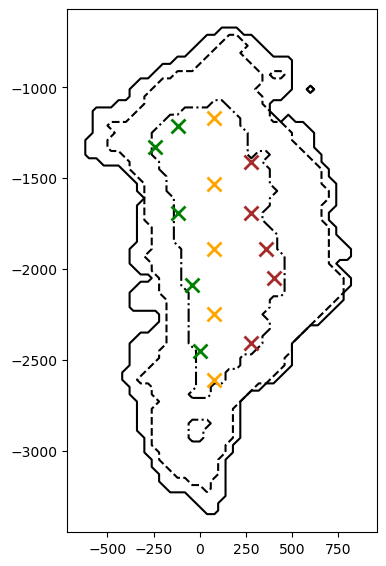

In [11]:
n_rows, n_cols = 1, 1
aspect_ratio = len(ds_bm5_40kms['x'])/len(ds_bm5_40kms['y'])
subplot_width = 4
subplot_height = subplot_width / aspect_ratio

plt.rcParams["figure.figsize"] = ((n_cols)*subplot_width, n_rows*subplot_height)
fig, ax = plt.subplots(n_rows, n_cols)

ax.contour(ds_age_40kms["x"], 
           ds_age_40kms["y"],
           mask_land_after_pII, levels=[0], colors="black")
ax.contour(ds_age_40kms["x"],
           ds_age_40kms["y"],
           mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax.contour(ds_age_40kms["x"], 
           ds_age_40kms["y"],
           mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax.plot(ds_age_40kms["x"].data[20], ds_age_40kms["y"].data[21], marker='x', color='orange', markersize=10, mew=2)
ax.plot(ds_age_40kms["x"].data[20], ds_age_40kms["y"].data[30], marker='x', color='orange', markersize=10, mew=2)
ax.plot(ds_age_40kms["x"].data[20], ds_age_40kms["y"].data[39], marker='x', color='orange', markersize=10, mew=2)
ax.plot(ds_age_40kms["x"].data[20], ds_age_40kms["y"].data[48], marker='x', color='orange', markersize=10, mew=2)
ax.plot(ds_age_40kms["x"].data[20], ds_age_40kms["y"].data[57], marker='x', color='orange', markersize=10, mew=2)

ax.plot(ds_age_40kms["x"].data[18], ds_age_40kms["y"].data[25], marker='x', color='green', markersize=10, mew=2)
ax.plot(ds_age_40kms["x"].data[17], ds_age_40kms["y"].data[34], marker='x', color='green', markersize=10, mew=2)
ax.plot(ds_age_40kms["x"].data[15], ds_age_40kms["y"].data[44], marker='x', color='green', markersize=10, mew=2)
ax.plot(ds_age_40kms["x"].data[12], ds_age_40kms["y"].data[53], marker='x', color='green', markersize=10, mew=2)
ax.plot(ds_age_40kms["x"].data[15], ds_age_40kms["y"].data[56], marker='x', color='green', markersize=10, mew=2)

ax.plot(ds_age_40kms["x"].data[25], ds_age_40kms["y"].data[26], marker='x', color='brown', markersize=10, mew=2)
ax.plot(ds_age_40kms["x"].data[28], ds_age_40kms["y"].data[35], marker='x', color='brown', markersize=10, mew=2)
ax.plot(ds_age_40kms["x"].data[27], ds_age_40kms["y"].data[39], marker='x', color='brown', markersize=10, mew=2)
ax.plot(ds_age_40kms["x"].data[25], ds_age_40kms["y"].data[44], marker='x', color='brown', markersize=10, mew=2)
ax.plot(ds_age_40kms["x"].data[25], ds_age_40kms["y"].data[51], marker='x', color='brown', markersize=10, mew=2)
plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/locs_age_abs_rel_err_vertical_profiles.png")

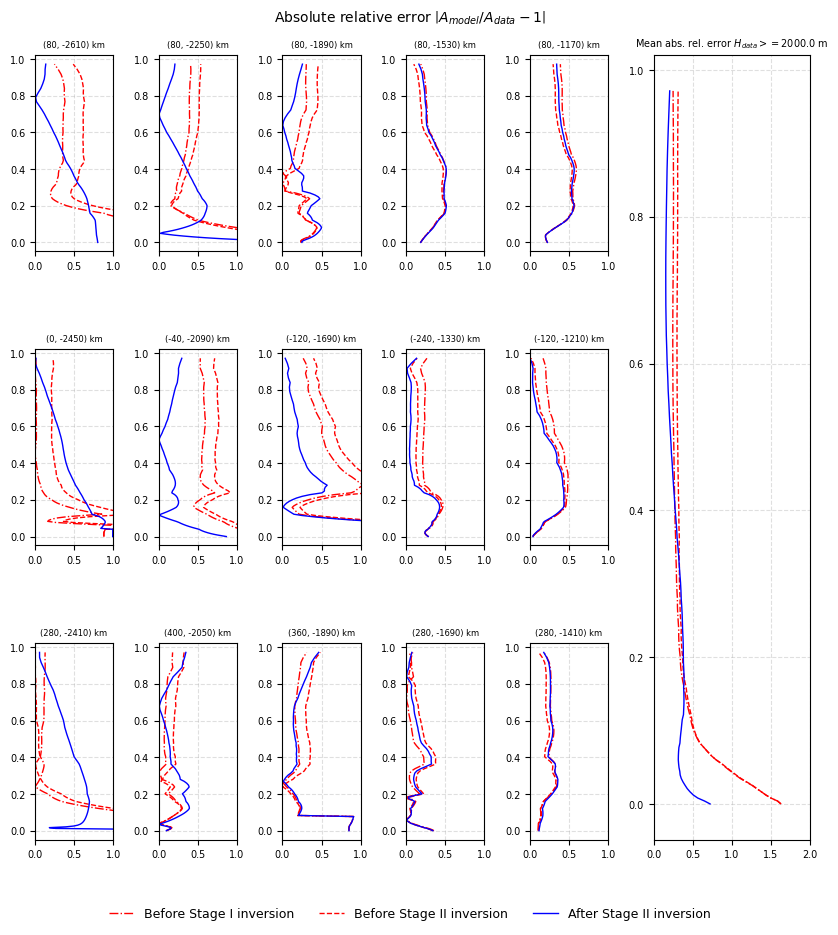

In [69]:
n_rows, n_cols = 3, 5
aspect_ratio = len(ds_bm5_40kms['x'])/len(ds_bm5_40kms['y'])
subplot_width = 2
subplot_height = subplot_width / aspect_ratio
plt.rcParams["figure.figsize"] = ((n_cols)*subplot_width, n_rows*subplot_height)

# Create GridSpec with an extra column on the right
fig = plt.figure()
gs = GridSpec(n_rows, n_cols + 1, width_ratios=[2]*n_cols + [4.0], wspace=0.5, hspace=0.5)
ax = np.empty((n_rows, n_cols), dtype=object)

# Create the 3x5 subplots
for i in range(n_rows):
    for j in range(n_cols):
        ax[i, j] = fig.add_subplot(gs[i, j])
        ax[i, j].tick_params(axis='both', which='major', labelsize=7)

# Create one tall subplot on the right spanning all rows
ax_right = fig.add_subplot(gs[:, -1])

mask = ((ds_age_40kms["age_c"].data >= 0) & (ds_age_40kms["age_c"].data <= 134000) & (ds_bm5_40kms["H"].data[None, :, :] >= 2000.0))*1.0
# mask = mask_AC.copy()*1.0
mask[mask == 0.0] = np.nan

age_c_data = ds_age_40kms["age_c"].data.copy()
age_c_data[age_c_data < 0] = np.nan 

age_c_before_pI = ds_final_state_before_pI["age_c"].data.copy()
age_c_before_pII = ds_final_state_before_pII["age_c"].data.copy()
age_c_after_pII = ds_final_state_after_pII["age_c"].data.copy()

ax_right.plot(np.nanmean(np.abs(age_c_before_pI/age_c_data - 1)*mask, axis = (1, 2)), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax_right.plot(np.nanmean(np.abs(age_c_before_pII/age_c_data - 1)*mask, axis = (1, 2)), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax_right.plot(np.nanmean(np.abs(age_c_after_pII/age_c_data - 1)*mask, axis = (1, 2)), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax_right.set_xlim(0, 2)
ax_right.tick_params(axis='both', which='major', labelsize=7)
ax[0, 0].set_xticks([0, 0.5, 1.0, 1.5, 2.0])
ax_right.grid(True, which='both', ls='--', alpha=0.4)
ax_right.set_title(r"Mean abs. rel. error $H_{data} >= 2000.0$ m", fontsize = 7)

y_idx = 21
x_idx = 20
ax[0, 0].plot(np.abs(age_c_before_pI[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax[0, 0].plot(np.abs(age_c_before_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax[0, 0].plot(np.abs(age_c_after_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax[0, 0].set_xlim(0, 1)
ax[0, 0].set_title(f"({int(ds_age_40kms['x'].data[x_idx])}, {int(ds_age_40kms['y'].data[y_idx])}) km", fontsize = 6)
ax[0, 0].set_xticks([0, 0.5, 1.0])
ax[0, 0].grid(True, which='both', ls='--', alpha=0.4)

y_idx = 30
x_idx = 20
ax[0, 1].plot(np.abs(age_c_before_pI[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax[0, 1].plot(np.abs(age_c_before_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax[0, 1].plot(np.abs(age_c_after_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax[0, 1].set_xlim(0, 1)
ax[0, 1].set_title(f"({int(ds_age_40kms['x'].data[x_idx])}, {int(ds_age_40kms['y'].data[y_idx])}) km", fontsize = 6)
ax[0, 1].set_xticks([0, 0.5, 1.0])
ax[0, 1].grid(True, which='both', ls='--', alpha=0.4)

y_idx = 39
x_idx = 20
ax[0, 2].plot(np.abs(age_c_before_pI[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax[0, 2].plot(np.abs(age_c_before_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax[0, 2].plot(np.abs(age_c_after_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax[0, 2].set_xlim(0, 1)
ax[0, 2].set_title(f"({int(ds_age_40kms['x'].data[x_idx])}, {int(ds_age_40kms['y'].data[y_idx])}) km", fontsize = 6)
ax[0, 2].set_xticks([0, 0.5, 1.0])
ax[0, 2].grid(True, which='both', ls='--', alpha=0.4)

y_idx = 48
x_idx = 20
ax[0, 3].plot(np.abs(age_c_before_pI[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax[0, 3].plot(np.abs(age_c_before_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax[0, 3].plot(np.abs(age_c_after_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax[0, 3].set_xlim(0, 1)
ax[0, 3].set_title(f"({int(ds_age_40kms['x'].data[x_idx])}, {int(ds_age_40kms['y'].data[y_idx])}) km", fontsize = 6)
ax[0, 3].set_xticks([0, 0.5, 1.0])
ax[0, 3].grid(True, which='both', ls='--', alpha=0.4)

y_idx = 57
x_idx = 20
ax[0, 4].plot(np.abs(age_c_before_pI[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax[0, 4].plot(np.abs(age_c_before_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax[0, 4].plot(np.abs(age_c_after_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax[0, 4].set_xlim(0, 1)
ax[0, 4].set_title(f"({int(ds_age_40kms['x'].data[x_idx])}, {int(ds_age_40kms['y'].data[y_idx])}) km", fontsize = 6)
ax[0, 4].set_xticks([0, 0.5, 1.0])
ax[0, 4].grid(True, which='both', ls='--', alpha=0.4)

y_idx = 25
x_idx = 18
ax[1, 0].plot(np.abs(age_c_before_pI[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax[1, 0].plot(np.abs(age_c_before_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax[1, 0].plot(np.abs(age_c_after_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax[1, 0].set_xlim(0, 1)
ax[1, 0].set_title(f"({int(ds_age_40kms['x'].data[x_idx])}, {int(ds_age_40kms['y'].data[y_idx])}) km", fontsize = 6)
ax[1, 0].set_xticks([0, 0.5, 1.0])
ax[1, 0].grid(True, which='both', ls='--', alpha=0.4)

y_idx = 34
x_idx = 17
ax[1, 1].plot(np.abs(age_c_before_pI[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax[1, 1].plot(np.abs(age_c_before_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax[1, 1].plot(np.abs(age_c_after_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax[1, 1].set_xlim(0, 1)
ax[1, 1].set_title(f"({int(ds_age_40kms['x'].data[x_idx])}, {int(ds_age_40kms['y'].data[y_idx])}) km", fontsize = 6)
ax[1, 1].set_xticks([0, 0.5, 1.0])
ax[1, 1].grid(True, which='both', ls='--', alpha=0.4)

y_idx = 44
x_idx = 15
ax[1, 2].plot(np.abs(age_c_before_pI[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax[1, 2].plot(np.abs(age_c_before_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax[1, 2].plot(np.abs(age_c_after_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax[1, 2].set_xlim(0, 1)
ax[1, 2].set_title(f"({int(ds_age_40kms['x'].data[x_idx])}, {int(ds_age_40kms['y'].data[y_idx])}) km", fontsize = 6)
ax[1, 2].set_xticks([0, 0.5, 1.0])
ax[1, 2].grid(True, which='both', ls='--', alpha=0.4)

y_idx = 53
x_idx = 12
ax[1, 3].plot(np.abs(age_c_before_pI[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax[1, 3].plot(np.abs(age_c_before_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax[1, 3].plot(np.abs(age_c_after_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax[1, 3].set_xlim(0, 1)
ax[1, 3].set_title(f"({int(ds_age_40kms['x'].data[x_idx])}, {int(ds_age_40kms['y'].data[y_idx])}) km", fontsize = 6)
ax[1, 3].set_xticks([0, 0.5, 1.0])
ax[1, 3].grid(True, which='both', ls='--', alpha=0.4)

y_idx = 56
x_idx = 15
ax[1, 4].plot(np.abs(age_c_before_pI[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax[1, 4].plot(np.abs(age_c_before_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax[1, 4].plot(np.abs(age_c_after_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax[1, 4].set_xlim(0, 1)
ax[1, 4].set_title(f"({int(ds_age_40kms['x'].data[x_idx])}, {int(ds_age_40kms['y'].data[y_idx])}) km", fontsize = 6)
ax[1, 4].set_xticks([0, 0.5, 1.0])
ax[1, 4].grid(True, which='both', ls='--', alpha=0.4)

y_idx = 26
x_idx = 25
ax[2, 0].plot(np.abs(age_c_before_pI[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax[2, 0].plot(np.abs(age_c_before_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax[2, 0].plot(np.abs(age_c_after_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax[2, 0].set_xlim(0, 1)
ax[2, 0].set_title(f"({int(ds_age_40kms['x'].data[x_idx])}, {int(ds_age_40kms['y'].data[y_idx])}) km", fontsize = 6)
ax[2, 0].set_xticks([0, 0.5, 1.0])
ax[2, 0].grid(True, which='both', ls='--', alpha=0.4)

y_idx = 35
x_idx = 28
ax[2, 1].plot(np.abs(age_c_before_pI[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax[2, 1].plot(np.abs(age_c_before_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax[2, 1].plot(np.abs(age_c_after_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax[2, 1].set_xlim(0, 1)
ax[2, 1].set_title(f"({int(ds_age_40kms['x'].data[x_idx])}, {int(ds_age_40kms['y'].data[y_idx])}) km", fontsize = 6)
ax[2, 1].set_xticks([0, 0.5, 1.0])
ax[2, 1].grid(True, which='both', ls='--', alpha=0.4)

y_idx = 39
x_idx = 27
ax[2, 2].plot(np.abs(age_c_before_pI[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax[2, 2].plot(np.abs(age_c_before_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax[2, 2].plot(np.abs(age_c_after_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax[2, 2].set_xlim(0, 1)
ax[2, 2].set_title(f"({int(ds_age_40kms['x'].data[x_idx])}, {int(ds_age_40kms['y'].data[y_idx])}) km", fontsize = 6)
ax[2, 2].set_xticks([0, 0.5, 1.0])
ax[2, 2].grid(True, which='both', ls='--', alpha=0.4)

y_idx = 44
x_idx = 25
ax[2, 3].plot(np.abs(age_c_before_pI[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax[2, 3].plot(np.abs(age_c_before_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax[2, 3].plot(np.abs(age_c_after_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax[2, 3].set_xlim(0, 1)
ax[2, 3].set_title(f"({int(ds_age_40kms['x'].data[x_idx])}, {int(ds_age_40kms['y'].data[y_idx])}) km", fontsize = 6)
ax[2, 3].set_xticks([0, 0.5, 1.0])
ax[2, 3].grid(True, which='both', ls='--', alpha=0.4)

y_idx = 51
x_idx = 25
ax[2, 4].plot(np.abs(age_c_before_pI[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax[2, 4].plot(np.abs(age_c_before_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax[2, 4].plot(np.abs(age_c_after_pII[:, y_idx, x_idx]/age_c_data[:, y_idx, x_idx] - 1), ds_age_40kms["sigma"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)
ax[2, 4].set_xlim(0, 1)
ax[2, 4].set_title(f"({int(ds_age_40kms['x'].data[x_idx])}, {int(ds_age_40kms['y'].data[y_idx])}) km", fontsize = 6)
ax[2, 4].set_xticks([0, 0.5, 1.0])
ax[2, 4].grid(True, which='both', ls='--', alpha=0.4)

# # Tighten everything up
# plt.subplots_adjust(top=0.90, bottom=0.08, hspace=0.15, wspace=0.25)

# Adjust suptitle placement
plt.suptitle(
    r"Absolute relative error $\left|A_{model}/A_{data} - 1\right|$",
    fontsize=10,
    y=0.925 # move closer to subplots (default ~1.0)
)

handles, labels = ax[0, 0].get_legend_handles_labels()
# Legend closer to subplots
fig.legend(
    handles, labels,
    loc='lower center',
    ncol=3,
    frameon=False,
    fontsize=9,
    bbox_to_anchor=(0.5, 0.02)  # smaller gap below plots
)

plt.tight_layout(rect=[0, 0.03, 1, 1])  # leave space on bottom for legend
plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/age_abs_rel_err_vertical_profiles.png")

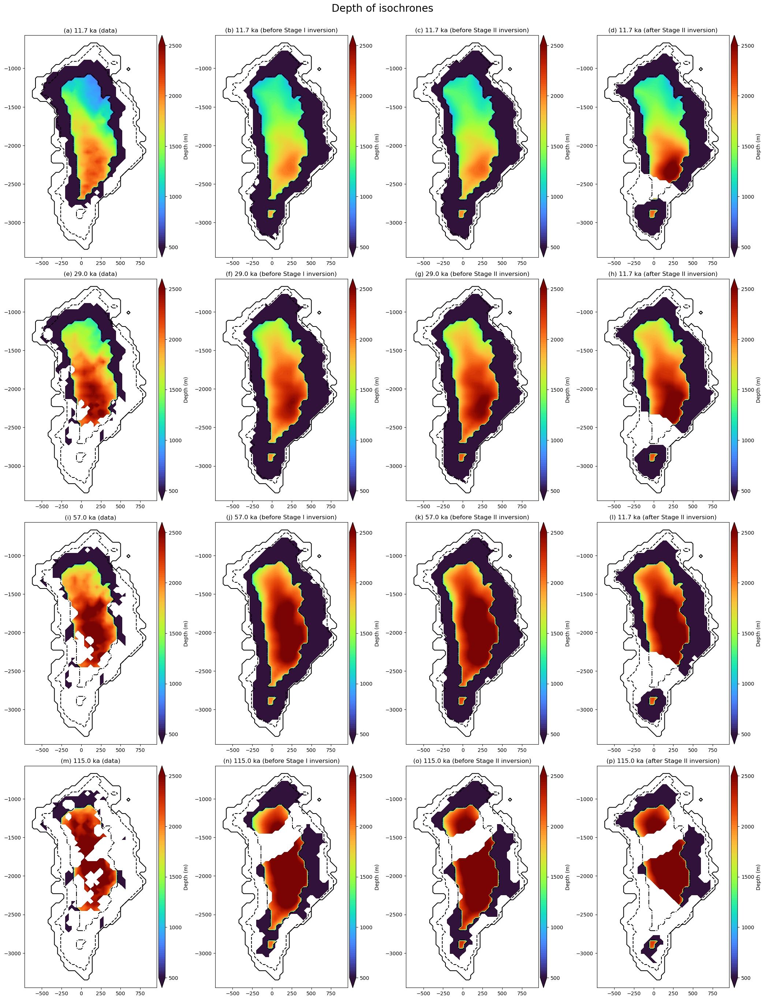

In [68]:
n_rows, n_cols = 4, 4
aspect_ratio = len(ds_age_40kms['x'])/len(ds_age_40kms['y'])
subplot_width = 4
subplot_height = subplot_width / aspect_ratio

plt.rcParams["figure.figsize"] = ((n_cols+1.25)*subplot_width, n_rows*subplot_height)
fig, ax = plt.subplots(n_rows, n_cols)

age_isochrones = [11700, 29000, 57000, 115000]

age_c_data = ds_age_40kms["age_c"].data.copy()
age_c_data[age_c_data < 0] = np.nan

age_c_before_pI = ds_final_state_before_pI["age_c"].data.copy()
age_c_before_pII = ds_final_state_before_pII["age_c"].data.copy()
age_c_after_pII = ds_final_state_after_pII["age_c"].data.copy()

H_before_pI = ds_final_state_before_pI["H"].data.copy()
H_before_pII = ds_final_state_before_pII["H"].data.copy()
H_after_pII = ds_final_state_after_pII["H"].data.copy()

field_data = ds_bm5_40kms['H'].data - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                                    ds_bm5_40kms['H'].data, 
                                                                    ds_age_40kms['age_c'].data, 
                                                                    age_iso_value = age_isochrones[0])
field_data[field_data == 0.0] = np.nan
field_data[ds_age_40kms['age_c'][-2] == 1000000.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field_data*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[0, 0],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[0, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[0, 0].set_title(f"(a) {age_isochrones[0]/1000} ka (data)")

field = H_before_pI - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                    H_before_pI, 
                                                    age_c_before_pI, 
                                                    age_iso_value = age_isochrones[0])

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[0, 1],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[0, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[0, 1].set_title(f"(b) {age_isochrones[0]/1000} ka (before Stage I inversion)")

field = H_before_pII - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                    H_before_pII, 
                                                    age_c_before_pII, 
                                                    age_iso_value = age_isochrones[0])

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[0, 2],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[0, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[0, 2].set_title(f"(c) {age_isochrones[0]/1000} ka (before Stage II inversion)")

field = H_after_pII - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                    H_after_pII, 
                                                    age_c_after_pII, 
                                                    age_iso_value = age_isochrones[0])

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[0, 3],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[0, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[0, 3].set_title(f"(d) {age_isochrones[0]/1000} ka (after Stage II inversion)")

field_data = ds_bm5_40kms['H'].data - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                                    ds_bm5_40kms['H'].data, 
                                                                    ds_age_40kms['age_c'].data, 
                                                                    age_iso_value = age_isochrones[1])
field_data[field_data == 0.0] = np.nan
field_data[ds_age_40kms['age_c'][-2] == 1000000.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field_data*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[1, 0],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[1, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[1, 0].set_title(f"(e) {age_isochrones[1]/1000} ka (data)")

field = H_before_pI - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                    H_before_pI, 
                                                    age_c_before_pI, 
                                                    age_iso_value = age_isochrones[1])

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[1, 1],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[1, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[1, 1].set_title(f"(f) {age_isochrones[1]/1000} ka (before Stage I inversion)")

field = H_before_pII - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                    H_before_pII, 
                                                    age_c_before_pII, 
                                                    age_iso_value = age_isochrones[1])

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[1, 2],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[1, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[1, 2].set_title(f"(g) {age_isochrones[1]/1000} ka (before Stage II inversion)")

field = H_after_pII - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                    H_after_pII, 
                                                    age_c_after_pII, 
                                                    age_iso_value = age_isochrones[1])

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[1, 3],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[1, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[1, 3].set_title(f"(h) {age_isochrones[0]/1000} ka (after Stage II inversion)")
# Adjust suptitle placement
plt.suptitle(
    r"Depth of isochrones",
    fontsize=20,
    y=1.003
)


field_data = ds_bm5_40kms['H'].data - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                                    ds_bm5_40kms['H'].data, 
                                                                    ds_age_40kms['age_c'].data, 
                                                                    age_iso_value = age_isochrones[2])
field_data[field_data == 0.0] = np.nan
field_data[ds_age_40kms['age_c'][-2] == 1000000.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field_data*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[2, 0],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[2, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[2, 0].set_title(f"(i) {age_isochrones[2]/1000} ka (data)")

field = H_before_pI - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                    H_before_pI, 
                                                    age_c_before_pI, 
                                                    age_iso_value = age_isochrones[2])

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[2, 1],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[2, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[2, 1].set_title(f"(j) {age_isochrones[2]/1000} ka (before Stage I inversion)")

field = H_before_pII - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                    H_before_pII, 
                                                    age_c_before_pII, 
                                                    age_iso_value = age_isochrones[2])

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[2, 2],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[2, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[2, 2].set_title(f"(k) {age_isochrones[2]/1000} ka (before Stage II inversion)")

field = H_after_pII - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                    H_after_pII, 
                                                    age_c_after_pII, 
                                                    age_iso_value = age_isochrones[2])

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[2, 3],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[2, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2, 3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[2, 3].set_title(f"(l) {age_isochrones[0]/1000} ka (after Stage II inversion)")

field_data = ds_bm5_40kms['H'].data - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                                    ds_bm5_40kms['H'].data, 
                                                                    ds_age_40kms['age_c'].data, 
                                                                    age_iso_value = age_isochrones[3])
field_data[field_data == 0.0] = np.nan
field_data[ds_age_40kms['age_c'][-2] == 1000000.0] = np.nan

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field_data*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[3, 0],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[3, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[3, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[3, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[3, 0].set_title(f"(m) {age_isochrones[3]/1000} ka (data)")

field = H_before_pI - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                    H_before_pI, 
                                                    age_c_before_pI, 
                                                    age_iso_value = age_isochrones[3])

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[3, 1],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[3, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[3, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[3, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[3, 1].set_title(f"(n) {age_isochrones[3]/1000} ka (before Stage I inversion)")

field = H_before_pII - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                    H_before_pII, 
                                                    age_c_before_pII, 
                                                    age_iso_value = age_isochrones[3])

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[3, 2],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[3, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[3, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[3, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[3, 2].set_title(f"(o) {age_isochrones[3]/1000} ka (before Stage II inversion)")

field = H_after_pII - ageContours.get_age_isochrone(ds_age_40kms['sigma'].data, 
                                                    H_after_pII, 
                                                    age_c_after_pII, 
                                                    age_iso_value = age_isochrones[3])

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field*mask_BM5_2000,
                cmap = "turbo", nbins = 100, vmin = 500.0, vmax = 2500.0, center = 1500.0,
                fig = fig, ax = ax[3, 3],
                cbar_label = r"Depth (m)", cbar_ticks=[500.0, 1000.0, 1500.0, 2000.0, 2500.0])

ax[3, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[3, 3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[3, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

ax[3, 3].set_title(f"(p) {age_isochrones[3]/1000} ka (after Stage II inversion)")

# Adjust suptitle placement
plt.suptitle(
    r"Depth of isochrones",
    fontsize=20,
    y=1.003
)

plt.tight_layout()
plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/depths_of_isochrones_model_data.png")

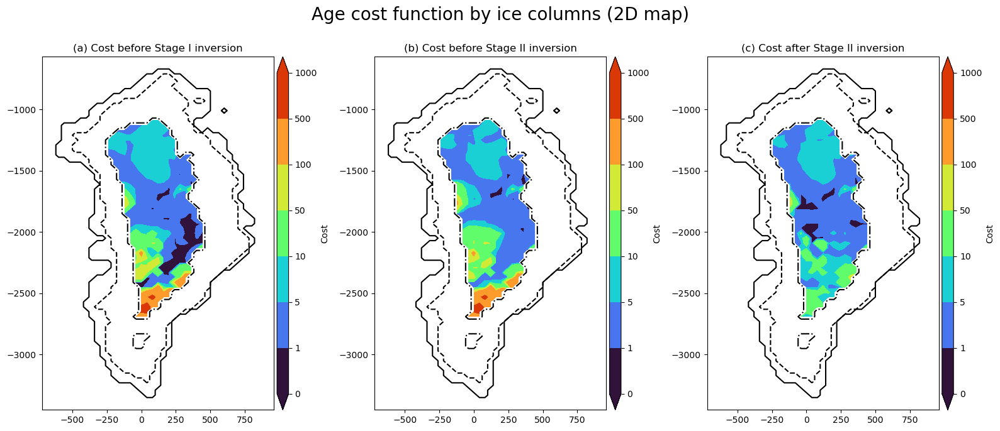

In [89]:
n_rows, n_cols = 1, 3
aspect_ratio = len(ds_age_40kms['x'])/len(ds_age_40kms['y'])
subplot_width = 4
subplot_height = subplot_width / aspect_ratio

plt.rcParams["figure.figsize"] = ((n_cols+1.0)*subplot_width, n_rows*subplot_height)
fig, ax = plt.subplots(n_rows, n_cols)

levels = [0.0, 1.0, 5.0, 10.0, 50.0, 100.0, 500.0, 1000.0]

cmap = cm.turbo
n_intervals = len(levels) - 1
colors = [cmap(i / n_intervals) for i in range(n_intervals)]

field = np.sum(costs_AC_before_pI, axis = 0)
field[field == 0.0] = np.nan
im = ax[0].contourf(
    ds_age_40kms['x'],
    ds_age_40kms['y'],
    field,  # or vx_data field you're plotting
    levels=levels,
    colors=colors,
    extend='both'
)

ax[0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

# Attach a new colorbar to this ax
divider = make_axes_locatable(ax[0])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = plt.colorbar(im, cax=cax, ticks=levels, spacing='uniform')

# Label and format
cb.set_label("Cost")
cb.ax.set_yticklabels([f"{lev:g}" for lev in levels])
ax[0].set_title("(a) Cost before Stage I inversion")

field = np.sum(costs_AC_before_pII, axis = 0)
field[field == 0.0] = np.nan
im = ax[1].contourf(
    ds_age_40kms['x'],
    ds_age_40kms['y'],
    field,  # or vx_data field you're plotting
    levels=levels,
    colors=colors,
    extend='both'
)

ax[1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

# Attach a new colorbar to this ax
divider = make_axes_locatable(ax[1])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = plt.colorbar(im, cax=cax, ticks=levels, spacing='uniform')

# Label and format
cb.set_label("Cost")
cb.ax.set_yticklabels([f"{lev:g}" for lev in levels])
ax[1].set_title("(b) Cost before Stage II inversion")

field = np.sum(costs_AC_after_pII, axis = 0)
field[field == 0.0] = np.nan
im = ax[2].contourf(
    ds_age_40kms['x'],
    ds_age_40kms['y'],
    field,  # or vx_data field you're plotting
    levels=levels,
    colors=colors,
    extend='both'
)

ax[2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

# Attach a new colorbar to this ax
divider = make_axes_locatable(ax[2])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = plt.colorbar(im, cax=cax, ticks=levels, spacing='uniform')

# Label and format
cb.set_label("Cost")
cb.ax.set_yticklabels([f"{lev:g}" for lev in levels])
ax[2].set_title("(c) Cost after Stage II inversion")

# Adjust suptitle placement
plt.suptitle(
    r"Age cost function by ice columns (2D map)",
    fontsize=20,
    y=1.003
)

plt.tight_layout()
plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/age_cost_2D_map.png")

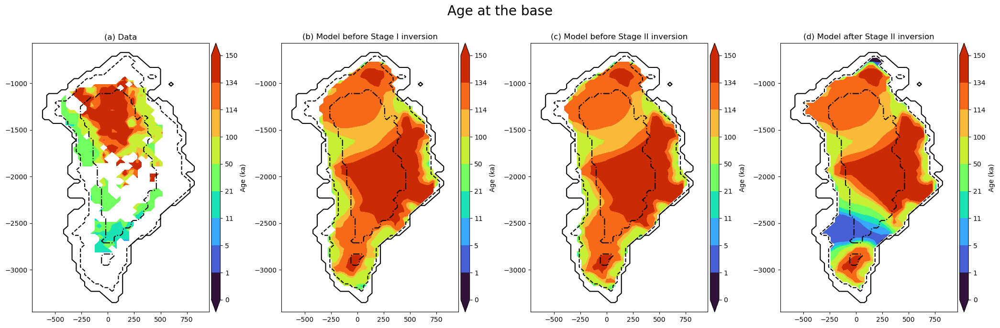

In [17]:
n_rows, n_cols = 1, 4
aspect_ratio = len(ds_age_40kms['x'])/len(ds_age_40kms['y'])
subplot_width = 4
subplot_height = subplot_width / aspect_ratio

plt.rcParams["figure.figsize"] = ((n_cols+1.25)*subplot_width, n_rows*subplot_height)
fig, ax = plt.subplots(n_rows, n_cols)

age_c_data = ds_age_40kms["age_c"].data.copy()
age_c_data[age_c_data < 0] = np.nan

age_c_before_pI = ds_final_state_before_pI["age_c"].data.copy()
age_c_before_pII = ds_final_state_before_pII["age_c"].data.copy()
age_c_after_pII = ds_final_state_after_pII["age_c"].data.copy()

levels = [0.0, 1.0, 5.0, 11.0, 21.0, 50.0, 100.0, 114.0, 134.0, 150.0]

cmap = cm.turbo
n_intervals = len(levels) - 1
colors = [cmap(i / n_intervals) for i in range(n_intervals)]

# Plot discrete contourf on the existing ax
field = age_c_data[0].copy() / 1000.0
field[field == 1000.0] = np.nan
im = ax[0].contourf(
    ds_age_40kms['x'],
    ds_age_40kms['y'],
    field,  # or vx_data field you're plotting
    levels=levels,
    colors=colors,
    extend='both'
)

ax[0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

# Attach a new colorbar to this ax
divider = make_axes_locatable(ax[0])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = plt.colorbar(im, cax=cax, ticks=levels, spacing='uniform')

# Label and format
cb.set_label("Age (ka)")
cb.ax.set_yticklabels([f"{lev:g}" for lev in levels])
ax[0].set_title("(a) Data")

# Plot discrete contourf on the existing ax
field = age_c_before_pI[0].copy() / 1000.0
field[field == 0.0] = np.nan
im = ax[1].contourf(
    ds_age_40kms['x'],
    ds_age_40kms['y'],
    field,  # or vx_data field you're plotting
    levels=levels,
    colors=colors,
    extend='both'
)

ax[1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

# Attach a new colorbar to this ax
divider = make_axes_locatable(ax[1])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = plt.colorbar(im, cax=cax, ticks=levels, spacing='uniform')

# Label and format
cb.set_label("Age (ka)")
cb.ax.set_yticklabels([f"{lev:g}" for lev in levels])
ax[1].set_title("(b) Model before Stage I inversion")

# Plot discrete contourf on the existing ax
field = age_c_before_pII[0].copy() / 1000.0
field[field == 0.0] = np.nan
im = ax[2].contourf(
    ds_age_40kms['x'],
    ds_age_40kms['y'],
    field,  # or vx_data field you're plotting
    levels=levels,
    colors=colors,
    extend='both'
)

ax[2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

# Attach a new colorbar to this ax
divider = make_axes_locatable(ax[2])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = plt.colorbar(im, cax=cax, ticks=levels, spacing='uniform')

# Label and format
cb.set_label("Age (ka)")
cb.ax.set_yticklabels([f"{lev:g}" for lev in levels])
ax[2].set_title("(c) Model before Stage II inversion")


# Plot discrete contourf on the existing ax
field = age_c_after_pII[0].copy() / 1000.0
field[field == 0.0] = np.nan
im = ax[3].contourf(
    ds_age_40kms['x'],
    ds_age_40kms['y'],
    field,  # or vx_data field you're plotting
    levels=levels,
    colors=colors,
    extend='both'
)

ax[3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_BM5_2000, levels=[0], colors="black", linestyles = "-.")

# Attach a new colorbar to this ax
divider = make_axes_locatable(ax[3])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = plt.colorbar(im, cax=cax, ticks=levels, spacing='uniform')

# Label and format
cb.set_label("Age (ka)")
cb.ax.set_yticklabels([f"{lev:g}" for lev in levels])
ax[3].set_title("(d) Model after Stage II inversion")

# Adjust suptitle placement
plt.suptitle(
    r"Age at the base",
    fontsize=20,
    y=1.003
)

plt.tight_layout()
plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/age_at_base_model_data.png")

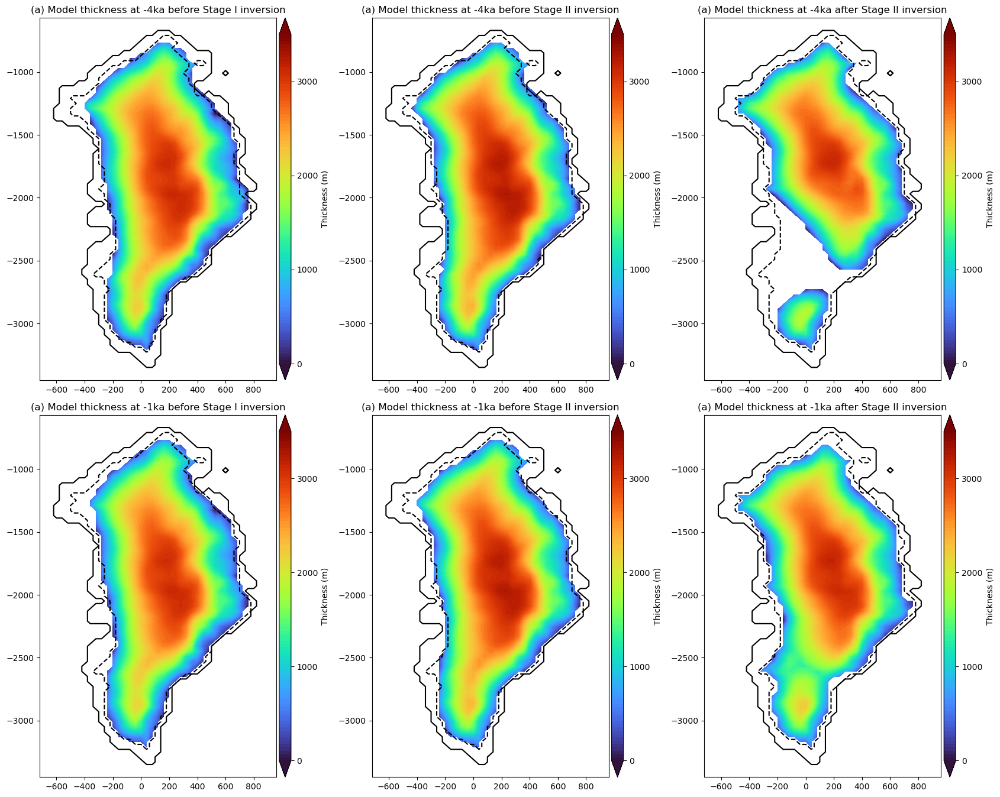

In [25]:
n_rows, n_cols = 2, 3
aspect_ratio = len(ds_age_40kms['x'])/len(ds_age_40kms['y'])
subplot_width = 4
subplot_height = subplot_width / aspect_ratio

H_m4ka_before_pI = ds_m4ka_state_before_pI["H"].data.copy()
H_m4ka_before_pII = ds_m4ka_state_before_pII["H"].data.copy()
H_m4ka_after_pII = ds_m4ka_state_after_pII["H"].data.copy()

H_m1ka_before_pI = ds_m1ka_state_before_pI["H"].data.copy()
H_m1ka_before_pII = ds_m1ka_state_before_pII["H"].data.copy()
H_m1ka_after_pII = ds_m1ka_state_after_pII["H"].data.copy()

plt.rcParams["figure.figsize"] = ((n_cols+1.25)*subplot_width, n_rows*subplot_height)
fig, ax = plt.subplots(n_rows, n_cols)

field = H_m4ka_before_pI.copy()
field[field == 0.0] = np.nan
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 3500.0, center = 1750.0,
                fig = fig, ax = ax[0, 0],
                cbar_label = r"Thickness (m)", cbar_ticks=[0.0, 1000.0, 2000.0, 3000.0])
ax[0, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 0].set_title("(a) Model thickness at -4ka before Stage I inversion")

field = H_m4ka_before_pII.copy()
field[field == 0.0] = np.nan
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 3500.0, center = 1750.0,
                fig = fig, ax = ax[0, 1],
                cbar_label = r"Thickness (m)", cbar_ticks=[0.0, 1000.0, 2000.0, 3000.0])
ax[0, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 1].set_title("(a) Model thickness at -4ka before Stage II inversion")

field = H_m4ka_after_pII.copy()
field[field == 0.0] = np.nan
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 3500.0, center = 1750.0,
                fig = fig, ax = ax[0, 2],
                cbar_label = r"Thickness (m)", cbar_ticks=[0.0, 1000.0, 2000.0, 3000.0])
ax[0, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 2].set_title("(a) Model thickness at -4ka after Stage II inversion")

field = H_m1ka_before_pI.copy()
field[field == 0.0] = np.nan
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 3500.0, center = 1750.0,
                fig = fig, ax = ax[1, 0],
                cbar_label = r"Thickness (m)", cbar_ticks=[0.0, 1000.0, 2000.0, 3000.0])
ax[1, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 0].set_title("(a) Model thickness at -1ka before Stage I inversion")

field = H_m1ka_before_pII.copy()
field[field == 0.0] = np.nan
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 3500.0, center = 1750.0,
                fig = fig, ax = ax[1, 1],
                cbar_label = r"Thickness (m)", cbar_ticks=[0.0, 1000.0, 2000.0, 3000.0])
ax[1, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 1].set_title("(a) Model thickness at -1ka before Stage II inversion")

field = H_m1ka_after_pII.copy()
field[field == 0.0] = np.nan
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 3500.0, center = 1750.0,
                fig = fig, ax = ax[1, 2],
                cbar_label = r"Thickness (m)", cbar_ticks=[0.0, 1000.0, 2000.0, 3000.0])
ax[1, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 2].set_title("(a) Model thickness at -1ka after Stage II inversion")

plt.tight_layout()
plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/thickness_minus_4ka_1ka.png")

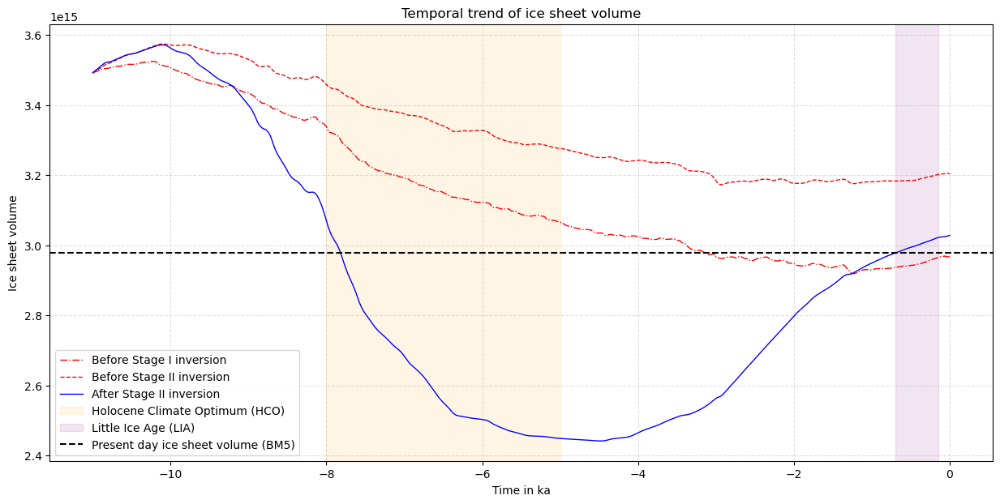

In [37]:
plt.rcParams["figure.figsize"] = (15, 7)
fig, ax = plt.subplots(1, 1)

ax.plot(ds_ser_before_pI["t"].data / 1000.0, ds_ser_before_pI["V_tot"].data, linestyle='-.', color='red', label = "Before Stage I inversion", linewidth = 1.0)
ax.plot(ds_ser_before_pII["t"].data / 1000.0, ds_ser_before_pII["V_tot"].data, linestyle='--', color='red', label = "Before Stage II inversion", linewidth = 1.0)
ax.plot(ds_ser_after_pII["t"].data / 1000.0, ds_ser_after_pII["V_tot"].data, linestyle='-', color='blue', label = "After Stage II inversion", linewidth = 1.0)

ax.axvspan(xmin=-8, xmax=-5, color='orange', alpha=0.1, label="Holocene Climate Optimum (HCO)")
ax.axvspan(xmin=-0.7, xmax=-0.15, color='purple', alpha=0.1, label="Little Ice Age (LIA)")
ax.axhline(y=ds_bm5_40kms["V_dummy2d"].data[0, 0], color='k', linestyle='--', label = "Present day ice sheet volume (BM5)")

ax.set_xlabel('Time in ka')
ax.set_ylabel('Ice sheet volume')
ax.set_title("Temporal trend of ice sheet volume")
ax.grid(True, which='major', ls='--', alpha=0.4)
ax.legend()

plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/volume.png")

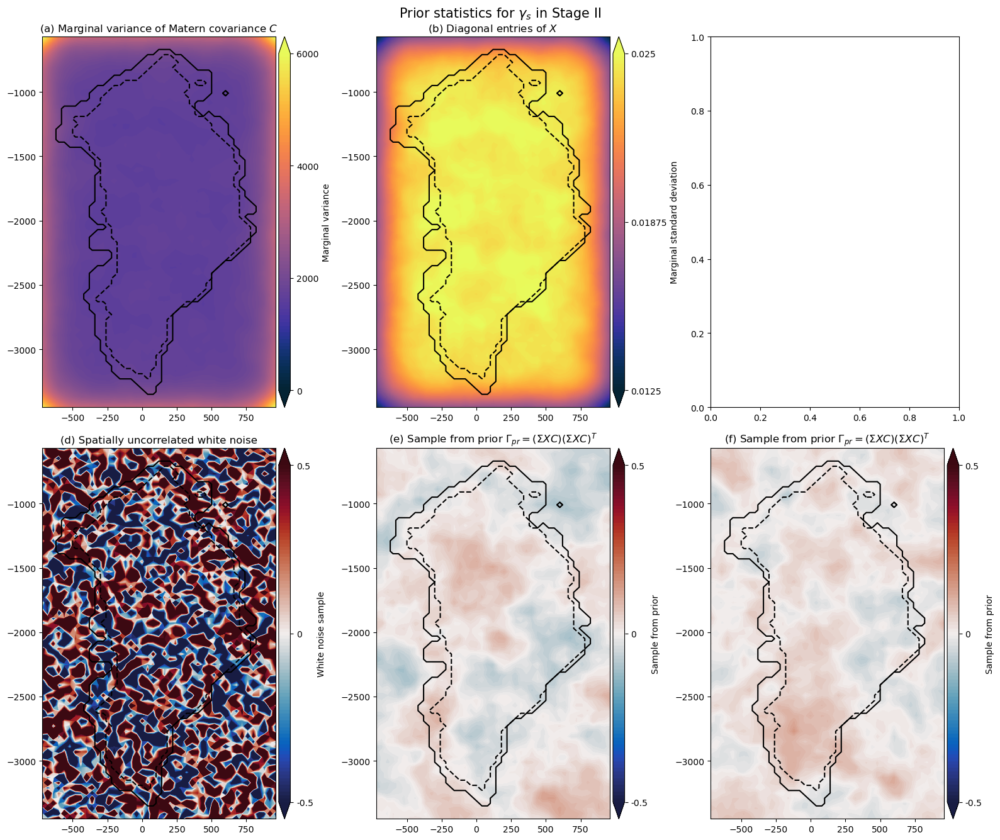

In [91]:
n_rows, n_cols = 2, 3
aspect_ratio = len(ds_age_40kms['x'])/len(ds_age_40kms['y'])
subplot_width = 4
subplot_height = subplot_width / aspect_ratio

plt.rcParams["figure.figsize"] = ((n_cols+1.0)*subplot_width, n_rows*subplot_height)
fig, ax = plt.subplots(n_rows, n_cols)

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                ds_prior_X["xx_gamma_sd"].data**(-2),
                cmap = cmo.thermal, nbins = 100, vmin = 0, vmax = 6000, center = 3000,
                fig = fig, ax = ax[0, 0],
                cbar_label = r"Marginal variance", cbar_ticks=[0, 2000, 4000, 6000])
ax[0, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 0].set_title(r"(a) Marginal variance of Matern covariance $C$")

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                ds_prior_X["xx_gamma_sd"].data,
                cmap = cmo.thermal, nbins = 100, vmin = 0.0125, vmax = 0.025, center = 0.01875,
                fig = fig, ax = ax[0, 1],
                cbar_label = r"Marginal standard deviation", cbar_ticks=[0.0125, 0.01875, 0.025])
ax[0, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 1].set_title(r"(b) Diagonal entries of $X$")

# plot_normal_new(ds_age_40kms['x'], 
#                 ds_age_40kms['y'], 
#                 ds_std_prior["xx_gamma_sd"].data**2,
#                 cmap = cmo.thermal, nbins = 100, vmin = 0, vmax = 0.0016, center = 0.0008,
#                 fig = fig, ax = ax[0, 2],
#                 cbar_label = r"Marginal variance", cbar_ticks=[0.0, 0.0004, 0.0008, 0.0012, 0.0016])
# ax[0, 2].contour(ds_age_40kms["x"], 
#                  ds_age_40kms["y"],
#                  mask_land_after_pII, levels=[0], colors="black")
# ax[0, 2].contour(ds_age_40kms["x"],
#                  ds_age_40kms["y"],
#                  mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
# ax[0, 2].set_title(r"(c) Marginal variance of prior $\Gamma_{pr} = (\Sigma X C)(\Sigma X C)^T$")

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                np.random.randn(73, 43),
                cmap = cmo.balance, 
                nbins = 100, vmin = -0.5, vmax = 0.5, center = 0.0,
                fig = fig, ax = ax[1, 0],
                cbar_label = "White noise sample", cbar_ticks=[-0.5, 0.0, 0.5])
ax[1, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 0].set_title("(d) Spatially uncorrelated white noise")

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                ds_sample_prior_1["xx_gamma_sd"].data,
                cmap = cmo.balance, 
                nbins = 100, vmin = -0.5, vmax = 0.5, center = 0.0,
                fig = fig, ax = ax[1, 1],
                cbar_label = "Sample from prior", cbar_ticks=[-0.5, 0.0, 0.5])
ax[1, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 1].set_title("(e) Sample from prior $\Gamma_{pr} = (\Sigma X C)(\Sigma X C)^T$")

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                ds_sample_prior_2["xx_gamma_sd"].data,
                cmap = cmo.balance, 
                nbins = 100, vmin = -0.5, vmax = 0.5, center = 0.0,
                fig = fig, ax = ax[1, 2],
                cbar_label = "Sample from prior", cbar_ticks=[-0.5, 0.0, 0.5])
ax[1, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 2].set_title("(f) Sample from prior $\Gamma_{pr} = (\Sigma X C)(\Sigma X C)^T$")

plt.suptitle("Prior statistics for $\gamma_s$ in Stage II", fontsize=15)
plt.tight_layout()

plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/pII_prior_stats.png")

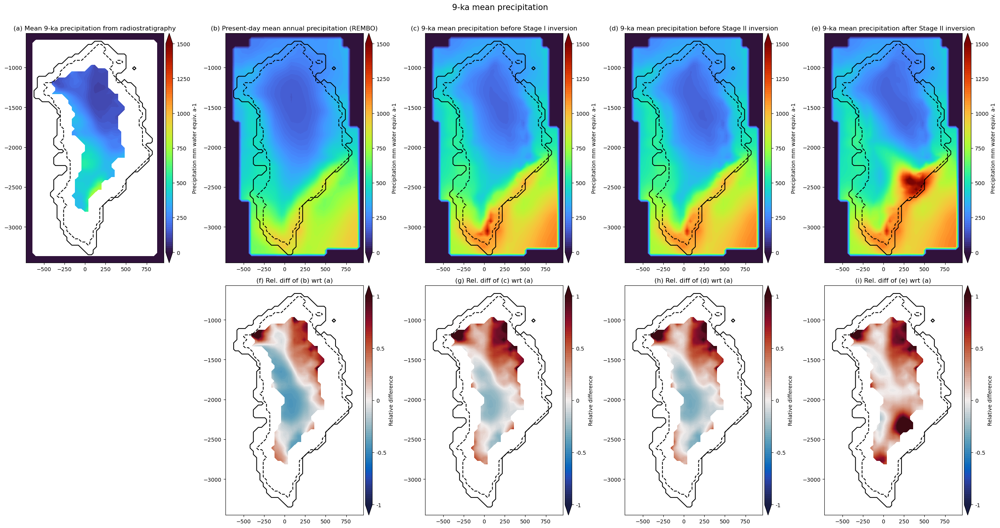

In [145]:
n_rows, n_cols = 2, 5
aspect_ratio = len(ds_bm5_40kms['x'])/len(ds_bm5_40kms['y'])
subplot_width = 4
subplot_height = subplot_width / aspect_ratio


plt.rcParams["figure.figsize"] = ((n_cols+1.5)*subplot_width, n_rows*subplot_height)
fig, ax = plt.subplots(n_rows, n_cols)

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                precip_radar_9ka_mean*1000.0,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 1500.0, center = 750.0,
                fig = fig, ax = ax[0, 0],
                cbar_label = r"Precipitation mm water equiv. a-1", cbar_ticks=[0.0, 250.0, 500.0, 750.0, 1000.0, 1250.0, 1500.0])

ax[0, 0].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 0].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 0].set_title("(a) Mean 9-ka precipitation from radiostratigraphy")

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                precip["precip_ma_present"].data,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 1500.0, center = 750.0,
                fig = fig, ax = ax[0, 1],
                cbar_label = r"Precipitation mm water equiv. a-1", cbar_ticks=[0.0, 250.0, 500.0, 750.0, 1000.0, 1250.0, 1500.0])

ax[0, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 1].set_title("(b) Present-day mean annual precipitation (REMBO)")

field = ds_precip_before_pI["da_precip_9ka_mean"].data[:, :, 0]*3.1556925445e+07*1000
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 1500.0, center = 750.0,
                fig = fig, ax = ax[0, 2],
                cbar_label = r"Precipitation mm water equiv. a-1", cbar_ticks=[0.0, 250.0, 500.0, 750.0, 1000.0, 1250.0, 1500.0])

ax[0, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 2].set_title("(c) 9-ka mean precipitation before Stage I inversion")

field = ds_precip_before_pII["da_precip_9ka_mean"].data[:, :, 0]*3.1556925445e+07*1000
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 1500.0, center = 750.0,
                fig = fig, ax = ax[0, 3],
                cbar_label = r"Precipitation mm water equiv. a-1", cbar_ticks=[0.0, 250.0, 500.0, 750.0, 1000.0, 1250.0, 1500.0])

ax[0, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 3].set_title("(d) 9-ka mean precipitation before Stage II inversion")

field = ds_precip_after_pII["da_precip_9ka_mean"].data[:, :, 0]*3.1556925445e+07*1000
plot_normal_new(ds_age_40kms["x"], 
                ds_age_40kms["y"], 
                field,
                cmap = "turbo", nbins = 100, vmin = 0.0, vmax = 1500.0, center = 750.0,
                fig = fig, ax = ax[0, 4],
                cbar_label = r"Precipitation mm water equiv. a-1", cbar_ticks=[0.0, 250.0, 500.0, 750.0, 1000.0, 1250.0, 1500.0])

ax[0, 4].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[0, 4].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[0, 4].set_title("(e) 9-ka mean precipitation after Stage II inversion")

fig.delaxes(ax[1, 0])
ax[1, 0].set_visible(False)

plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                precip["precip_ma_present"].data/(precip_radar_9ka_mean*1000.0) - 1,
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[1, 1],
                cbar_label = r"Relative difference", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[1, 1].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 1].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 1].set_title("(f) Rel. diff of (b) wrt (a)")

field = ds_precip_before_pI["da_precip_9ka_mean"].data[:, :, 0]*3.1556925445e+07*1000
plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field/(precip_radar_9ka_mean*1000.0) - 1,
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[1, 2],
                cbar_label = r"Relative difference", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[1, 2].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 2].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 2].set_title("(g) Rel. diff of (c) wrt (a)")

field = ds_precip_before_pII["da_precip_9ka_mean"].data[:, :, 0]*3.1556925445e+07*1000
plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field/(precip_radar_9ka_mean*1000.0) - 1,
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[1, 3],
                cbar_label = r"Relative difference", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[1, 3].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 3].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 3].set_title("(h) Rel. diff of (d) wrt (a)")

field = ds_precip_after_pII["da_precip_9ka_mean"].data[:, :, 0]*3.1556925445e+07*1000
plot_normal_new(ds_age_40kms['x'], 
                ds_age_40kms['y'], 
                field/(precip_radar_9ka_mean*1000.0) - 1,
                cmap = cmo.balance, nbins = 100, vmin = -1.0, vmax = 1.0, center = 0.0,
                fig = fig, ax = ax[1, 4],
                cbar_label = r"Relative difference", cbar_ticks=[-1.0, -0.5, 0.0, 0.5, 1.0])

ax[1, 4].contour(ds_age_40kms["x"], 
                 ds_age_40kms["y"],
                 mask_land_after_pII, levels=[0], colors="black")
ax[1, 4].contour(ds_age_40kms["x"],
                 ds_age_40kms["y"],
                 mask_ice_after_pII, levels=[0], colors="black", linestyles = "dashed")
ax[1, 4].set_title("(i) Rel. diff of (e) wrt (a)")

plt.suptitle("9-ka mean precipitation", fontsize=15, y=1.005)
plt.tight_layout()

plt.savefig("/scratch2/shreyas/thesis_results/chapter_7/precip_9ka_mean_model_data.png")